In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments


Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1162, done.
remote: Counting objects: 100% (228/228), done.
remote: Compressing objects: 100% (133/133), done.
remote: Total 1162 (delta 149), reused 166 (delta 95), pack-reused 934
Receiving objects: 100% (1162/1162), 40.84 MiB | 13.96 MiB/s, done.
Resolving deltas: 100% (811/811), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_TransformedLatentDist import make_lm_program_ig_weird1_batched, make_lm_program_ig_weird1
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_coupling_LearnedBaseDist_weird1_v1"

#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0

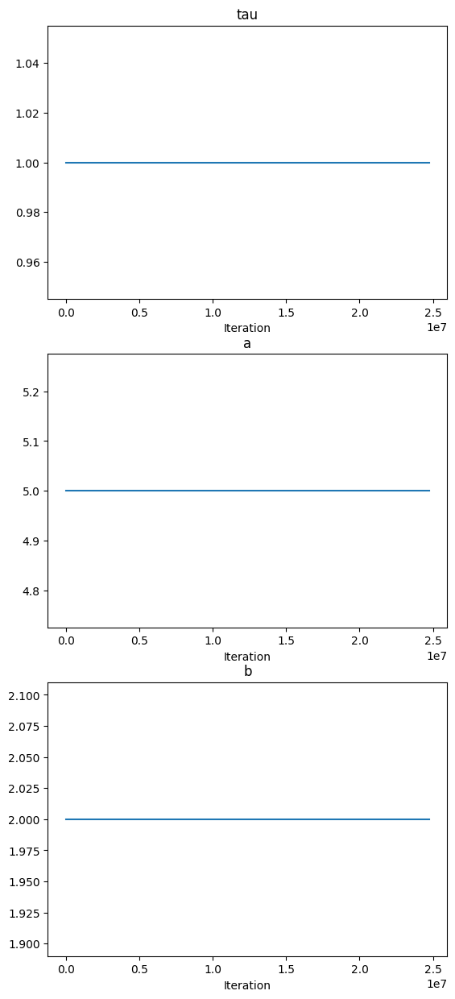

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_weird1_batched,
    curriculum= curriculum,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 100/100 [00:01<00:00, 73.84it/s]


{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0834), 'min': tensor(0.), 'max': tensor(1.0000)}, 'y': {'mean': tensor(2.4984), 'variance': tensor(1.5866), 'min': tensor(-18.5459), 'max': tensor(16.9980)}, 'beta': {'mean': tensor([0.9952, 1.0017, 1.0030, 1.0019, 0.9957]), 'variance': tensor([0.5011, 0.4983, 0.5022, 0.5003, 0.4956]), 'min': tensor([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.9605e-08]), 'max': tensor([2., 2., 2., 2., 2.])}}
Statistics for sigma_squared:
Mean: tensor([0.5007])
Variance: tensor([0.0854])
Min: tensor([0.0945])
Max: tensor([5.2243])


Statistics for time:
Mean: 0.5029080919618718
Variance: 0.0833528309034726
Min: 1.2755393981933594e-05
Max: 0.9999710917472839


Statistics for base_sample_beta:
Mean: tensor([-0.0047, -0.0044,  0.0083,  0.0067, -0.0061])
Variance: tensor([1.0028, 0.9886, 1.0055, 0.9931, 1.0050])
Min: tensor([-4.6772, -4.0699, -4.0767, -3.8251, -3.8705])
Max: tensor([3.8730, 4.0758, 4.0111, 3.7085, 4.0123])




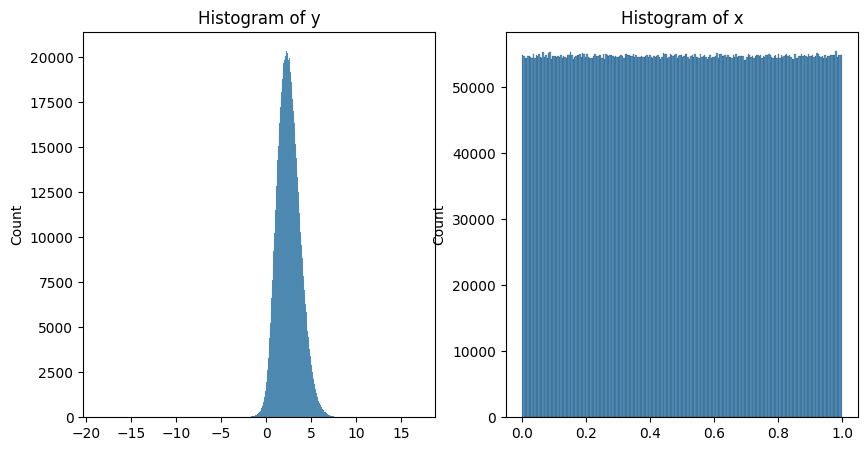

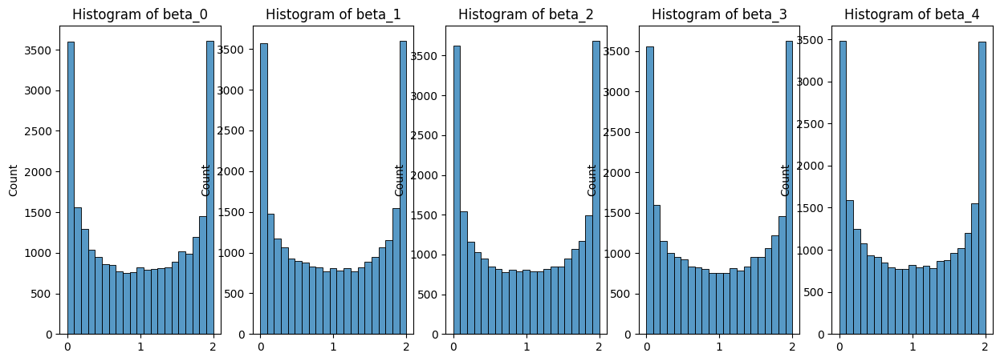

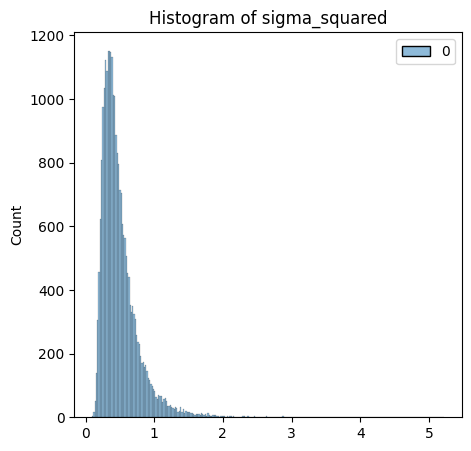

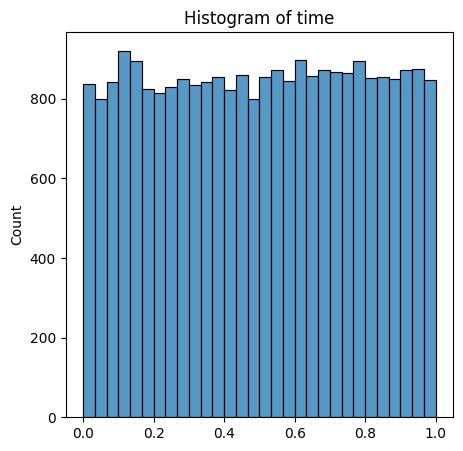

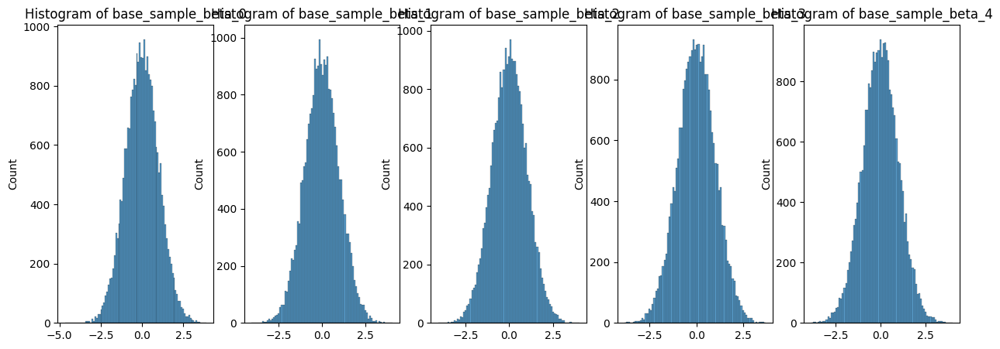

####################################################################################################
Epoch 99


100%|██████████| 100/100 [00:00<00:00, 101.20it/s]


{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0833), 'min': tensor(1.7881e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(2.5068), 'variance': tensor(1.5830), 'min': tensor(-17.8922), 'max': tensor(19.5055)}, 'beta': {'mean': tensor([0.9989, 1.0051, 1.0035, 1.0055, 1.0010]), 'variance': tensor([0.4998, 0.4975, 0.4946, 0.5006, 0.5017]), 'min': tensor([0.0000e+00, 5.9605e-08, 5.9605e-08, 0.0000e+00, 0.0000e+00]), 'max': tensor([2., 2., 2., 2., 2.])}}
Statistics for sigma_squared:
Mean: tensor([0.4998])
Variance: tensor([0.0826])
Min: tensor([0.1066])
Max: tensor([7.0324])


Statistics for time:
Mean: 0.5016206871252507
Variance: 0.08441082305901368
Min: 6.020069122314453e-06
Max: 0.9999204277992249


Statistics for base_sample_beta:
Mean: tensor([-5.8317e-04,  2.4413e-03,  1.0755e-03,  6.7300e-03,  1.8731e-05])
Variance: tensor([1.0060, 0.9965, 0.9923, 1.0258, 1.0022])
Min: tensor([-3.7566, -4.1895, -4.2130, -3.9926, -4.0392])
Max: tensor([3.7010, 4.2870, 4.0561, 4.1038, 3.9006]

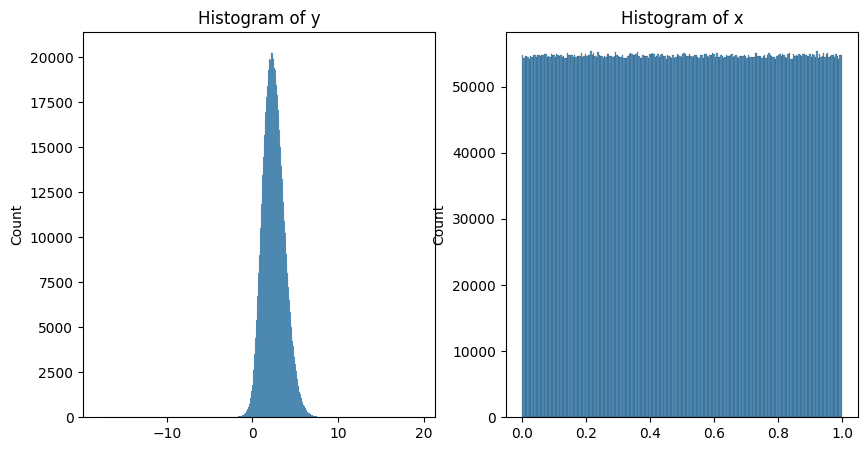

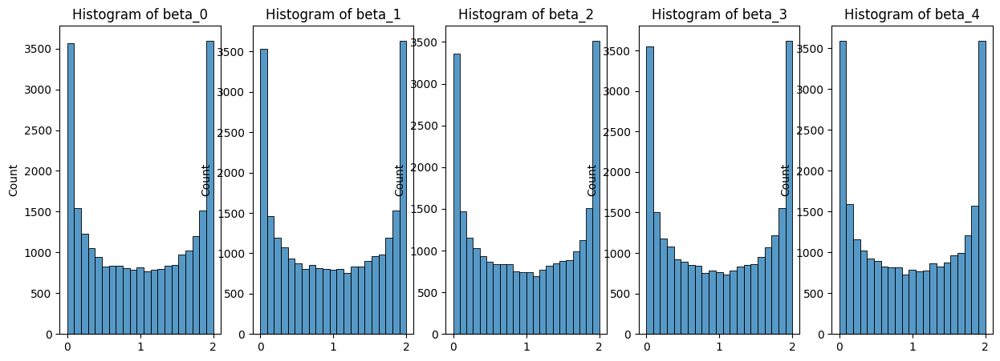

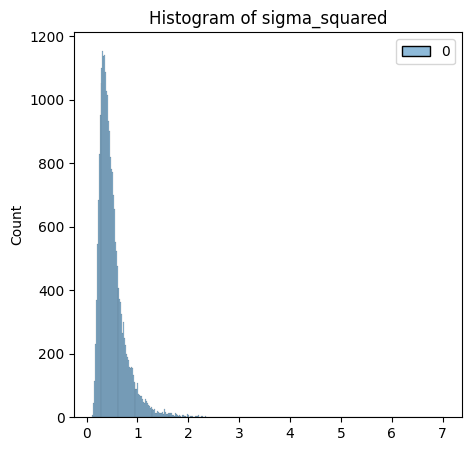

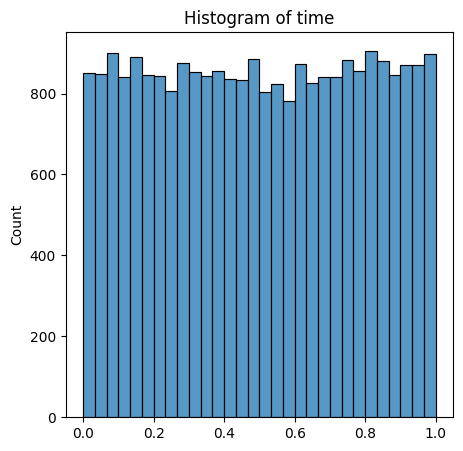

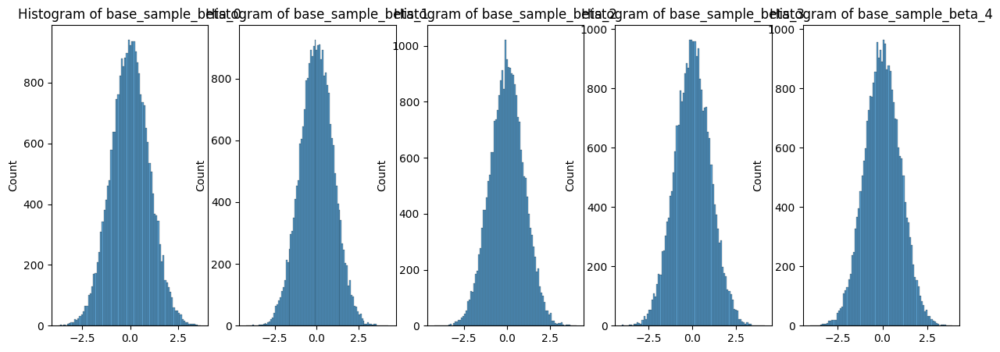

[{'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0834),
   'min': tensor(0.),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(2.4984),
   'variance': tensor(1.5866),
   'min': tensor(-18.5459),
   'max': tensor(16.9980)},
  'beta': {'mean': tensor([0.9952, 1.0017, 1.0030, 1.0019, 0.9957]),
   'variance': tensor([0.5011, 0.4983, 0.5022, 0.5003, 0.4956]),
   'min': tensor([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.9605e-08]),
   'max': tensor([2., 2., 2., 2., 2.])}},
 {'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0833),
   'min': tensor(1.7881e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(2.5068),
   'variance': tensor(1.5830),
   'min': tensor(-17.8922),
   'max': tensor(19.5055)},
  'beta': {'mean': tensor([0.9989, 1.0051, 1.0035, 1.0055, 1.0010]),
   'variance': tensor([0.4998, 0.4975, 0.4946, 0.5006, 0.5017]),
   'min': tensor([0.0000e+00, 5.9605e-08, 5.9605e-08, 0.0000e+00, 0.0000e+00]),
   'max': tensor([2., 2., 2., 2., 2.])}}]

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 100
)

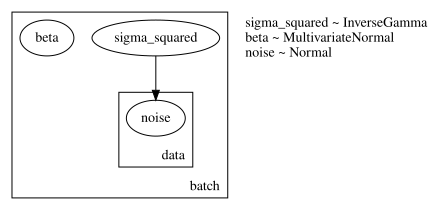

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 8,
    d_ff = 512*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 6,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 1024,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'9.63e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-4,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 5e-5,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0

)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_06_25_14_58_23")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_19_43_57'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

Could not load model


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


{'loss_mean': 178.4488525390625,
 'loss_median': 178.42568969726562,
 'loss_std': 1.9531142711639404,
 'loss_FM_mean': 1.6888614892959595,
 'loss_FM_median': 1.6876624822616577,
 'loss_FM_std': 0.01584620773792267,
 'loss_NLL_mean': 355.2088623046875,
 'loss_NLL_median': 355.1806945800781,
 'loss_NLL_std': 3.896298885345459}

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:27<00:00,  1.81it/s]


Epoch 0:
Training: {'loss_mean': 12.822159767150879, 'loss_median': 12.825963020324707, 'loss_std': 0.6708669066429138, 'loss_FM_mean': 3.641113042831421, 'loss_FM_median': 3.615875244140625, 'loss_FM_std': 0.1762930005788803, 'loss_NLL_mean': 22.003206253051758, 'loss_NLL_median': 22.133028030395508, 'loss_NLL_std': 1.327721357345581}
Validation: {'loss_mean': 27.38259506225586, 'loss_median': 9.25016975402832, 'loss_std': 110.32070922851562, 'loss_FM_mean': 38.04796600341797, 'loss_FM_median': 1.7869442701339722, 'loss_FM_std': 220.61595153808594, 'loss_NLL_mean': 16.717226028442383, 'loss_NLL_median': 16.724464416503906, 'loss_NLL_std': 0.15733790397644043}
Validation curriculum: {'loss_mean': 891921.0625, 'loss_median': 9.293791770935059, 'loss_std': 6243195.5, 'loss_FM_mean': 1783825.125, 'loss_FM_median': 1.7956428527832031, 'loss_FM_std': 12486391.0, 'loss_NLL_mean': 16.777233123779297, 'loss_NLL_median': 16.779144287109375, 'loss_NLL_std': 0.18168479204177856}
Time: 330.3758802

100%|██████████| 49/49 [00:27<00:00,  1.78it/s]


Epoch 1:
Training: {'loss_mean': 10.611104965209961, 'loss_median': 10.54646110534668, 'loss_std': 0.6124604940414429, 'loss_FM_mean': 3.284705638885498, 'loss_FM_median': 3.347850799560547, 'loss_FM_std': 0.3770586848258972, 'loss_NLL_mean': 17.937503814697266, 'loss_NLL_median': 17.805898666381836, 'loss_NLL_std': 0.881313145160675}
Validation: {'loss_mean': 7.722725868225098, 'loss_median': 7.6800761222839355, 'loss_std': 0.21287494897842407, 'loss_FM_mean': 1.4548089504241943, 'loss_FM_median': 1.3521760702133179, 'loss_FM_std': 0.42202967405319214, 'loss_NLL_mean': 13.990642547607422, 'loss_NLL_median': 14.00652027130127, 'loss_NLL_std': 0.07254139333963394}
Validation curriculum: {'loss_mean': 7.7837395668029785, 'loss_median': 7.666024684906006, 'loss_std': 0.6405760645866394, 'loss_FM_mean': 1.5968677997589111, 'loss_FM_median': 1.3604439496994019, 'loss_FM_std': 1.2745096683502197, 'loss_NLL_mean': 13.970610618591309, 'loss_NLL_median': 13.971389770507812, 'loss_NLL_std': 0.06

100%|██████████| 49/49 [00:27<00:00,  1.78it/s]


Epoch 2:
Training: {'loss_mean': 8.921003341674805, 'loss_median': 8.857025146484375, 'loss_std': 0.3542538583278656, 'loss_FM_mean': 1.9054187536239624, 'loss_FM_median': 1.845751404762268, 'loss_FM_std': 0.31480124592781067, 'loss_NLL_mean': 15.9365873336792, 'loss_NLL_median': 15.906540870666504, 'loss_NLL_std': 0.401641309261322}
Validation: {'loss_mean': 7.796749114990234, 'loss_median': 6.853201866149902, 'loss_std': 6.035606384277344, 'loss_FM_mean': 2.706096649169922, 'loss_FM_median': 0.8187721371650696, 'loss_FM_std': 12.064141273498535, 'loss_NLL_mean': 12.887402534484863, 'loss_NLL_median': 12.892010688781738, 'loss_NLL_std': 0.05013265460729599}
Validation curriculum: {'loss_mean': 6.842075347900391, 'loss_median': 6.836795806884766, 'loss_std': 0.03223447874188423, 'loss_FM_mean': 0.8124279975891113, 'loss_FM_median': 0.8100841641426086, 'loss_FM_std': 0.04122791439294815, 'loss_NLL_mean': 12.871723175048828, 'loss_NLL_median': 12.87433910369873, 'loss_NLL_std': 0.0504829

100%|██████████| 49/49 [00:27<00:00,  1.78it/s]


Epoch 3:
Training: {'loss_mean': 8.093664169311523, 'loss_median': 8.081277847290039, 'loss_std': 0.18617737293243408, 'loss_FM_mean': 1.3168611526489258, 'loss_FM_median': 1.302911639213562, 'loss_FM_std': 0.10328256338834763, 'loss_NLL_mean': 14.870465278625488, 'loss_NLL_median': 14.864216804504395, 'loss_NLL_std': 0.27861931920051575}
Validation: {'loss_mean': 6.766207218170166, 'loss_median': 6.718979358673096, 'loss_std': 0.391912043094635, 'loss_FM_mean': 0.7689875364303589, 'loss_FM_median': 0.6546826362609863, 'loss_FM_std': 0.7889353632926941, 'loss_NLL_mean': 12.763426780700684, 'loss_NLL_median': 12.766775131225586, 'loss_NLL_std': 0.07053616642951965}
Validation curriculum: {'loss_mean': 6.703088283538818, 'loss_median': 6.701629161834717, 'loss_std': 0.03846907988190651, 'loss_FM_mean': 0.6560171246528625, 'loss_FM_median': 0.657217264175415, 'loss_FM_std': 0.021451497450470924, 'loss_NLL_mean': 12.75015926361084, 'loss_NLL_median': 12.749407768249512, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:27<00:00,  1.80it/s]


Epoch 4:
Training: {'loss_mean': 7.569470405578613, 'loss_median': 7.565324783325195, 'loss_std': 0.13442672789096832, 'loss_FM_mean': 1.1462188959121704, 'loss_FM_median': 1.1496316194534302, 'loss_FM_std': 0.05677041783928871, 'loss_NLL_mean': 13.992721557617188, 'loss_NLL_median': 13.986760139465332, 'loss_NLL_std': 0.2485342174768448}
Validation: {'loss_mean': 6.595284461975098, 'loss_median': 6.592617511749268, 'loss_std': 0.038025375455617905, 'loss_FM_mean': 0.6354010701179504, 'loss_FM_median': 0.6305330991744995, 'loss_FM_std': 0.04166501387953758, 'loss_NLL_mean': 12.555167198181152, 'loss_NLL_median': 12.55405044555664, 'loss_NLL_std': 0.06267018616199493}
Validation curriculum: {'loss_mean': 6.6039628982543945, 'loss_median': 6.590256690979004, 'loss_std': 0.06695427000522614, 'loss_FM_mean': 0.6604502201080322, 'loss_FM_median': 0.6350019574165344, 'loss_FM_std': 0.11306587606668472, 'loss_NLL_mean': 12.547473907470703, 'loss_NLL_median': 12.544501304626465, 'loss_NLL_std'

100%|██████████| 49/49 [00:27<00:00,  1.80it/s]


Epoch 5:
Training: {'loss_mean': 7.031620502471924, 'loss_median': 7.060678482055664, 'loss_std': 0.23740749061107635, 'loss_FM_mean': 1.0933213233947754, 'loss_FM_median': 1.085670828819275, 'loss_FM_std': 0.08393282443284988, 'loss_NLL_mean': 12.969921112060547, 'loss_NLL_median': 13.031152725219727, 'loss_NLL_std': 0.45400694012641907}
Validation: {'loss_mean': 5.745121002197266, 'loss_median': 5.735265731811523, 'loss_std': 0.03649802878499031, 'loss_FM_mean': 0.5490639209747314, 'loss_FM_median': 0.5464436411857605, 'loss_FM_std': 0.019110918045043945, 'loss_NLL_mean': 10.941177368164062, 'loss_NLL_median': 10.932839393615723, 'loss_NLL_std': 0.06600721925497055}
Validation curriculum: {'loss_mean': 5.743988513946533, 'loss_median': 5.739605903625488, 'loss_std': 0.034431327134370804, 'loss_FM_mean': 0.5525602102279663, 'loss_FM_median': 0.5482609868049622, 'loss_FM_std': 0.018371643498539925, 'loss_NLL_mean': 10.935417175292969, 'loss_NLL_median': 10.931324005126953, 'loss_NLL_st

100%|██████████| 49/49 [00:27<00:00,  1.76it/s]


Epoch 6:
Training: {'loss_mean': 5.852523326873779, 'loss_median': 5.852064609527588, 'loss_std': 0.43008244037628174, 'loss_FM_mean': 1.0750792026519775, 'loss_FM_median': 1.0533725023269653, 'loss_FM_std': 0.10907141864299774, 'loss_NLL_mean': 10.62996768951416, 'loss_NLL_median': 10.644704818725586, 'loss_NLL_std': 0.8379808664321899}
Validation: {'loss_mean': 4.340250492095947, 'loss_median': 4.334386348724365, 'loss_std': 0.05340375378727913, 'loss_FM_mean': 0.5273807048797607, 'loss_FM_median': 0.5292954444885254, 'loss_FM_std': 0.018420713022351265, 'loss_NLL_mean': 8.153120040893555, 'loss_NLL_median': 8.14304256439209, 'loss_NLL_std': 0.10898655652999878}
Validation curriculum: {'loss_mean': 4.332582950592041, 'loss_median': 4.33831787109375, 'loss_std': 0.05595586448907852, 'loss_FM_mean': 0.5227690935134888, 'loss_FM_median': 0.5197761058807373, 'loss_FM_std': 0.025056084617972374, 'loss_NLL_mean': 8.142396926879883, 'loss_NLL_median': 8.142349243164062, 'loss_NLL_std': 0.10

100%|██████████| 49/49 [00:27<00:00,  1.76it/s]


Epoch 7:
Training: {'loss_mean': 4.80294942855835, 'loss_median': 4.813772678375244, 'loss_std': 0.26214131712913513, 'loss_FM_mean': 1.0040074586868286, 'loss_FM_median': 0.9681403040885925, 'loss_FM_std': 0.12957552075386047, 'loss_NLL_mean': 8.601890563964844, 'loss_NLL_median': 8.601150512695312, 'loss_NLL_std': 0.47610121965408325}
Validation: {'loss_mean': 3.6817514896392822, 'loss_median': 3.6877269744873047, 'loss_std': 0.05909760668873787, 'loss_FM_mean': 0.43230414390563965, 'loss_FM_median': 0.4341307580471039, 'loss_FM_std': 0.016818473115563393, 'loss_NLL_mean': 6.931198596954346, 'loss_NLL_median': 6.949723243713379, 'loss_NLL_std': 0.11463683843612671}
Validation curriculum: {'loss_mean': 3.6866414546966553, 'loss_median': 3.6800098419189453, 'loss_std': 0.06248670443892479, 'loss_FM_mean': 0.43513616919517517, 'loss_FM_median': 0.4319725036621094, 'loss_FM_std': 0.015375182963907719, 'loss_NLL_mean': 6.938146591186523, 'loss_NLL_median': 6.931729793548584, 'loss_NLL_std

100%|██████████| 49/49 [00:27<00:00,  1.79it/s]


Epoch 8:
Training: {'loss_mean': 3.92779541015625, 'loss_median': 3.923588752746582, 'loss_std': 0.30008429288864136, 'loss_FM_mean': 0.8997172117233276, 'loss_FM_median': 0.8880745768547058, 'loss_FM_std': 0.11916527152061462, 'loss_NLL_mean': 6.955873489379883, 'loss_NLL_median': 6.932644844055176, 'loss_NLL_std': 0.5474279522895813}
Validation: {'loss_mean': 2.787848711013794, 'loss_median': 2.798349380493164, 'loss_std': 0.05333414673805237, 'loss_FM_mean': 0.3828619420528412, 'loss_FM_median': 0.3795809745788574, 'loss_FM_std': 0.017352059483528137, 'loss_NLL_mean': 5.192835330963135, 'loss_NLL_median': 5.195112705230713, 'loss_NLL_std': 0.10063110291957855}
Validation curriculum: {'loss_mean': 2.7923645973205566, 'loss_median': 2.792978525161743, 'loss_std': 0.053728170692920685, 'loss_FM_mean': 0.3785737454891205, 'loss_FM_median': 0.3762923777103424, 'loss_FM_std': 0.014896579086780548, 'loss_NLL_mean': 5.206155776977539, 'loss_NLL_median': 5.20258903503418, 'loss_NLL_std': 0.1

100%|██████████| 49/49 [00:27<00:00,  1.78it/s]


Epoch 9:
Training: {'loss_mean': 3.158233880996704, 'loss_median': 3.138711452484131, 'loss_std': 0.2075415998697281, 'loss_FM_mean': 0.7944982051849365, 'loss_FM_median': 0.7884402871131897, 'loss_FM_std': 0.10084053874015808, 'loss_NLL_mean': 5.521969795227051, 'loss_NLL_median': 5.5102081298828125, 'loss_NLL_std': 0.3777333199977875}
Validation: {'loss_mean': 1.9333351850509644, 'loss_median': 1.9332983493804932, 'loss_std': 0.06455341726541519, 'loss_FM_mean': 0.297567218542099, 'loss_FM_median': 0.29461470246315, 'loss_FM_std': 0.015593496151268482, 'loss_NLL_mean': 3.5691027641296387, 'loss_NLL_median': 3.558988571166992, 'loss_NLL_std': 0.12305351346731186}
Validation curriculum: {'loss_mean': 1.9209840297698975, 'loss_median': 1.9162242412567139, 'loss_std': 0.057645998895168304, 'loss_FM_mean': 0.2932920455932617, 'loss_FM_median': 0.29319483041763306, 'loss_FM_std': 0.01244264468550682, 'loss_NLL_mean': 3.5486762523651123, 'loss_NLL_median': 3.541123151779175, 'loss_NLL_std':

100%|██████████| 49/49 [00:27<00:00,  1.79it/s]


Epoch 10:
Training: {'loss_mean': 2.708211660385132, 'loss_median': 2.6881492137908936, 'loss_std': 0.23083913326263428, 'loss_FM_mean': 0.7509173154830933, 'loss_FM_median': 0.7375131845474243, 'loss_FM_std': 0.09556315094232559, 'loss_NLL_mean': 4.665506362915039, 'loss_NLL_median': 4.640064716339111, 'loss_NLL_std': 0.42648935317993164}
Validation: {'loss_mean': 1.6663061380386353, 'loss_median': 1.6714000701904297, 'loss_std': 0.06597442924976349, 'loss_FM_mean': 0.30461016297340393, 'loss_FM_median': 0.30331674218177795, 'loss_FM_std': 0.01572212018072605, 'loss_NLL_mean': 3.0280022621154785, 'loss_NLL_median': 3.0395190715789795, 'loss_NLL_std': 0.12854796648025513}
Validation curriculum: {'loss_mean': 1.6958842277526855, 'loss_median': 1.6987826824188232, 'loss_std': 0.05054643005132675, 'loss_FM_mean': 0.30891430377960205, 'loss_FM_median': 0.3081485331058502, 'loss_FM_std': 0.01358241867274046, 'loss_NLL_mean': 3.0828540325164795, 'loss_NLL_median': 3.093780994415283, 'loss_NL

100%|██████████| 49/49 [00:27<00:00,  1.79it/s]


Epoch 11:
Training: {'loss_mean': 2.3116812705993652, 'loss_median': 2.272099018096924, 'loss_std': 0.24416907131671906, 'loss_FM_mean': 0.7241296172142029, 'loss_FM_median': 0.7130947113037109, 'loss_FM_std': 0.09998714178800583, 'loss_NLL_mean': 3.8992326259613037, 'loss_NLL_median': 3.8195977210998535, 'loss_NLL_std': 0.4436876177787781}
Validation: {'loss_mean': 1.706316590309143, 'loss_median': 1.7045955657958984, 'loss_std': 0.07825177162885666, 'loss_FM_mean': 0.2886212468147278, 'loss_FM_median': 0.28787651658058167, 'loss_FM_std': 0.016867218539118767, 'loss_NLL_mean': 3.124011993408203, 'loss_NLL_median': 3.1329586505889893, 'loss_NLL_std': 0.15156401693820953}
Validation curriculum: {'loss_mean': 1.6966294050216675, 'loss_median': 1.6995062828063965, 'loss_std': 0.06311603635549545, 'loss_FM_mean': 0.28787702322006226, 'loss_FM_median': 0.2870177924633026, 'loss_FM_std': 0.01782376505434513, 'loss_NLL_mean': 3.105381965637207, 'loss_NLL_median': 3.1078872680664062, 'loss_NLL

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 12:
Training: {'loss_mean': 1.8504096269607544, 'loss_median': 1.818150281906128, 'loss_std': 0.35153913497924805, 'loss_FM_mean': 0.7412797808647156, 'loss_FM_median': 0.7233654856681824, 'loss_FM_std': 0.12583525478839874, 'loss_NLL_mean': 2.9595394134521484, 'loss_NLL_median': 2.9101321697235107, 'loss_NLL_std': 0.6381590366363525}
Validation: {'loss_mean': 0.36090731620788574, 'loss_median': 0.34839656949043274, 'loss_std': 0.07586655020713806, 'loss_FM_mean': 0.2857932150363922, 'loss_FM_median': 0.2835157811641693, 'loss_FM_std': 0.02321050688624382, 'loss_NLL_mean': 0.4360212981700897, 'loss_NLL_median': 0.39866626262664795, 'loss_NLL_std': 0.14164265990257263}
Validation curriculum: {'loss_mean': 0.36398395895957947, 'loss_median': 0.3554420471191406, 'loss_std': 0.08646421879529953, 'loss_FM_mean': 0.2885764539241791, 'loss_FM_median': 0.2879868447780609, 'loss_FM_std': 0.02014945074915886, 'loss_NLL_mean': 0.43939146399497986, 'loss_NLL_median': 0.435990571975708, 'loss

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 13:
Training: {'loss_mean': 1.378576397895813, 'loss_median': 1.3626233339309692, 'loss_std': 0.2683480679988861, 'loss_FM_mean': 0.7567580938339233, 'loss_FM_median': 0.7430605888366699, 'loss_FM_std': 0.10920068621635437, 'loss_NLL_mean': 2.000394821166992, 'loss_NLL_median': 1.9894187450408936, 'loss_NLL_std': 0.5186783671379089}
Validation: {'loss_mean': -0.3482592701911926, 'loss_median': -0.33839863538742065, 'loss_std': 0.08757542073726654, 'loss_FM_mean': 0.3472473621368408, 'loss_FM_median': 0.34057044982910156, 'loss_FM_std': 0.05114394798874855, 'loss_NLL_mean': -1.043765902519226, 'loss_NLL_median': -1.0442521572113037, 'loss_NLL_std': 0.15828807651996613}
Validation curriculum: {'loss_mean': -0.35448840260505676, 'loss_median': -0.36691948771476746, 'loss_std': 0.09527035802602768, 'loss_FM_mean': 0.3328908681869507, 'loss_FM_median': 0.32628753781318665, 'loss_FM_std': 0.047284141182899475, 'loss_NLL_mean': -1.041867733001709, 'loss_NLL_median': -1.0490996837615967,

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 14:
Training: {'loss_mean': 0.9083173274993896, 'loss_median': 0.8828600645065308, 'loss_std': 0.351122111082077, 'loss_FM_mean': 0.8097445368766785, 'loss_FM_median': 0.7919833064079285, 'loss_FM_std': 0.13876347243785858, 'loss_NLL_mean': 1.0068901777267456, 'loss_NLL_median': 0.9455628395080566, 'loss_NLL_std': 0.6325352787971497}
Validation: {'loss_mean': -0.39983662962913513, 'loss_median': -0.4051561951637268, 'loss_std': 0.08707991987466812, 'loss_FM_mean': 0.3425132632255554, 'loss_FM_median': 0.3296245336532593, 'loss_FM_std': 0.07292691618204117, 'loss_NLL_mean': -1.1421864032745361, 'loss_NLL_median': -1.1763097047805786, 'loss_NLL_std': 0.14846710860729218}
Validation curriculum: {'loss_mean': -0.4092540442943573, 'loss_median': -0.40579307079315186, 'loss_std': 0.11342605948448181, 'loss_FM_mean': 0.34212276339530945, 'loss_FM_median': 0.32797327637672424, 'loss_FM_std': 0.09050939232110977, 'loss_NLL_mean': -1.160630702972412, 'loss_NLL_median': -1.1630955934524536,

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 15:
Training: {'loss_mean': 0.47583428025245667, 'loss_median': 0.40276476740837097, 'loss_std': 0.31837642192840576, 'loss_FM_mean': 0.7195931077003479, 'loss_FM_median': 0.6878008842468262, 'loss_FM_std': 0.1310989409685135, 'loss_NLL_mean': 0.23207537829875946, 'loss_NLL_median': 0.11075497418642044, 'loss_NLL_std': 0.5986170768737793}
Validation: {'loss_mean': -0.7068019509315491, 'loss_median': -0.7193838953971863, 'loss_std': 0.0871918648481369, 'loss_FM_mean': 0.3120829463005066, 'loss_FM_median': 0.2996322512626648, 'loss_FM_std': 0.052234869450330734, 'loss_NLL_mean': -1.725687026977539, 'loss_NLL_median': -1.7298738956451416, 'loss_NLL_std': 0.14633150398731232}
Validation curriculum: {'loss_mean': -0.6730122566223145, 'loss_median': -0.6886534094810486, 'loss_std': 0.08748884499073029, 'loss_FM_mean': 0.31789588928222656, 'loss_FM_median': 0.30809637904167175, 'loss_FM_std': 0.05277598276734352, 'loss_NLL_mean': -1.6639201641082764, 'loss_NLL_median': -1.68633055686950

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 16:
Training: {'loss_mean': 0.08634206652641296, 'loss_median': 0.06668324768543243, 'loss_std': 0.2687768042087555, 'loss_FM_mean': 0.6636139154434204, 'loss_FM_median': 0.6499581336975098, 'loss_FM_std': 0.12279743701219559, 'loss_NLL_mean': -0.4909297823905945, 'loss_NLL_median': -0.5439013242721558, 'loss_NLL_std': 0.48660528659820557}
Validation: {'loss_mean': -1.262768268585205, 'loss_median': -1.259035348892212, 'loss_std': 0.06941302865743637, 'loss_FM_mean': 0.3012012243270874, 'loss_FM_median': 0.2802887558937073, 'loss_FM_std': 0.0664033517241478, 'loss_NLL_mean': -2.826737403869629, 'loss_NLL_median': -2.8242809772491455, 'loss_NLL_std': 0.10550149530172348}
Validation curriculum: {'loss_mean': -1.266060709953308, 'loss_median': -1.270339012145996, 'loss_std': 0.1023111641407013, 'loss_FM_mean': 0.28397876024246216, 'loss_FM_median': 0.2750001847743988, 'loss_FM_std': 0.05428634583950043, 'loss_NLL_mean': -2.8161001205444336, 'loss_NLL_median': -2.827630043029785, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 17:
Training: {'loss_mean': -0.3136366605758667, 'loss_median': -0.3453885614871979, 'loss_std': 0.282476007938385, 'loss_FM_mean': 0.5813140869140625, 'loss_FM_median': 0.5709785223007202, 'loss_FM_std': 0.10046069324016571, 'loss_NLL_mean': -1.2085872888565063, 'loss_NLL_median': -1.2856853008270264, 'loss_NLL_std': 0.5321172475814819}
Validation: {'loss_mean': -0.8283329606056213, 'loss_median': -0.8346843123435974, 'loss_std': 0.1145668476819992, 'loss_FM_mean': 0.30938056111335754, 'loss_FM_median': 0.26590487360954285, 'loss_FM_std': 0.11457446962594986, 'loss_NLL_mean': -1.9660465717315674, 'loss_NLL_median': -2.0054919719696045, 'loss_NLL_std': 0.15283764898777008}
Validation curriculum: {'loss_mean': -0.8339418768882751, 'loss_median': -0.8419613838195801, 'loss_std': 0.10811783373355865, 'loss_FM_mean': 0.29953059554100037, 'loss_FM_median': 0.28862500190734863, 'loss_FM_std': 0.08909443020820618, 'loss_NLL_mean': -1.967414379119873, 'loss_NLL_median': -1.99032258987426

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 18:
Training: {'loss_mean': -0.5846666097640991, 'loss_median': -0.6243354082107544, 'loss_std': 0.2046966403722763, 'loss_FM_mean': 0.5433554649353027, 'loss_FM_median': 0.5248350501060486, 'loss_FM_std': 0.09899238497018814, 'loss_NLL_mean': -1.712688684463501, 'loss_NLL_median': -1.7841819524765015, 'loss_NLL_std': 0.3797796666622162}
Validation: {'loss_mean': -1.8046661615371704, 'loss_median': -1.802268147468567, 'loss_std': 0.07242569327354431, 'loss_FM_mean': 0.15963925421237946, 'loss_FM_median': 0.15557323396205902, 'loss_FM_std': 0.026930859312415123, 'loss_NLL_mean': -3.7689709663391113, 'loss_NLL_median': -3.7643985748291016, 'loss_NLL_std': 0.12687388062477112}
Validation curriculum: {'loss_mean': -1.8128423690795898, 'loss_median': -1.8143328428268433, 'loss_std': 0.07083023339509964, 'loss_FM_mean': 0.1534741371870041, 'loss_FM_median': 0.15042130649089813, 'loss_FM_std': 0.022293362766504288, 'loss_NLL_mean': -3.7791593074798584, 'loss_NLL_median': -3.787399768829

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 19:
Training: {'loss_mean': -0.6450814008712769, 'loss_median': -0.7735587358474731, 'loss_std': 0.6945428252220154, 'loss_FM_mean': 0.5106469392776489, 'loss_FM_median': 0.48847731947898865, 'loss_FM_std': 0.15858528017997742, 'loss_NLL_mean': -1.800809621810913, 'loss_NLL_median': -2.045968770980835, 'loss_NLL_std': 1.2664930820465088}
Validation: {'loss_mean': -1.5076353549957275, 'loss_median': -1.5155746936798096, 'loss_std': 0.08263994008302689, 'loss_FM_mean': 0.1494770497083664, 'loss_FM_median': 0.15025906264781952, 'loss_FM_std': 0.016396360471844673, 'loss_NLL_mean': -3.164747476577759, 'loss_NLL_median': -3.2002370357513428, 'loss_NLL_std': 0.1578579843044281}
Validation curriculum: {'loss_mean': -1.4997172355651855, 'loss_median': -1.5074896812438965, 'loss_std': 0.0661056712269783, 'loss_FM_mean': 0.14586466550827026, 'loss_FM_median': 0.14502951502799988, 'loss_FM_std': 0.01542134303599596, 'loss_NLL_mean': -3.1452994346618652, 'loss_NLL_median': -3.169827938079834

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 20:
Training: {'loss_mean': -0.8289650678634644, 'loss_median': -0.916237473487854, 'loss_std': 0.49787527322769165, 'loss_FM_mean': 0.4612060785293579, 'loss_FM_median': 0.4452809989452362, 'loss_FM_std': 0.12344956398010254, 'loss_NLL_mean': -2.119136095046997, 'loss_NLL_median': -2.2825233936309814, 'loss_NLL_std': 0.9018131494522095}
Validation: {'loss_mean': -1.709904432296753, 'loss_median': -1.7122217416763306, 'loss_std': 0.09517073631286621, 'loss_FM_mean': 0.17383766174316406, 'loss_FM_median': 0.17194746434688568, 'loss_FM_std': 0.027655232697725296, 'loss_NLL_mean': -3.593647003173828, 'loss_NLL_median': -3.5759236812591553, 'loss_NLL_std': 0.17029999196529388}
Validation curriculum: {'loss_mean': -1.678411841392517, 'loss_median': -1.6766003370285034, 'loss_std': 0.09501541405916214, 'loss_FM_mean': 0.18329983949661255, 'loss_FM_median': 0.1880352795124054, 'loss_FM_std': 0.028419094160199165, 'loss_NLL_mean': -3.540123701095581, 'loss_NLL_median': -3.524526119232177

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 21:
Training: {'loss_mean': -0.9631795287132263, 'loss_median': -1.010068416595459, 'loss_std': 0.2846856117248535, 'loss_FM_mean': 0.4426009953022003, 'loss_FM_median': 0.4279862344264984, 'loss_FM_std': 0.091087207198143, 'loss_NLL_mean': -2.368960380554199, 'loss_NLL_median': -2.456145763397217, 'loss_NLL_std': 0.5322475433349609}
Validation: {'loss_mean': -2.1085550785064697, 'loss_median': -2.1224608421325684, 'loss_std': 0.07545951008796692, 'loss_FM_mean': 0.17664413154125214, 'loss_FM_median': 0.1740134209394455, 'loss_FM_std': 0.029563670977950096, 'loss_NLL_mean': -4.393753528594971, 'loss_NLL_median': -4.411953926086426, 'loss_NLL_std': 0.1332775503396988}
Validation curriculum: {'loss_mean': -2.1172235012054443, 'loss_median': -2.121271848678589, 'loss_std': 0.08480311930179596, 'loss_FM_mean': 0.17835921049118042, 'loss_FM_median': 0.17661568522453308, 'loss_FM_std': 0.03333360329270363, 'loss_NLL_mean': -4.412806034088135, 'loss_NLL_median': -4.42971134185791, 'loss

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 22:
Training: {'loss_mean': -0.9974691271781921, 'loss_median': -1.1103296279907227, 'loss_std': 0.4517050087451935, 'loss_FM_mean': 0.44026410579681396, 'loss_FM_median': 0.4259723722934723, 'loss_FM_std': 0.09142331779003143, 'loss_NLL_mean': -2.435202121734619, 'loss_NLL_median': -2.659287929534912, 'loss_NLL_std': 0.851739764213562}
Validation: {'loss_mean': -2.001359224319458, 'loss_median': -2.014014482498169, 'loss_std': 0.07592524588108063, 'loss_FM_mean': 0.1359357386827469, 'loss_FM_median': 0.13132792711257935, 'loss_FM_std': 0.018219564110040665, 'loss_NLL_mean': -4.138653755187988, 'loss_NLL_median': -4.1604180335998535, 'loss_NLL_std': 0.14062440395355225}
Validation curriculum: {'loss_mean': -1.988752841949463, 'loss_median': -1.986795425415039, 'loss_std': 0.10323873907327652, 'loss_FM_mean': 0.13872967660427094, 'loss_FM_median': 0.1356159895658493, 'loss_FM_std': 0.021479681134223938, 'loss_NLL_mean': -4.116235256195068, 'loss_NLL_median': -4.091063022613525, 'l

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 23:
Training: {'loss_mean': -1.099778413772583, 'loss_median': -1.1770551204681396, 'loss_std': 0.4543546140193939, 'loss_FM_mean': 0.40873318910598755, 'loss_FM_median': 0.40280404686927795, 'loss_FM_std': 0.07105713337659836, 'loss_NLL_mean': -2.608290433883667, 'loss_NLL_median': -2.7650485038757324, 'loss_NLL_std': 0.8797138333320618}
Validation: {'loss_mean': -2.124837636947632, 'loss_median': -2.111908197402954, 'loss_std': 0.07259418070316315, 'loss_FM_mean': 0.12147492170333862, 'loss_FM_median': 0.1182192787528038, 'loss_FM_std': 0.015356098301708698, 'loss_NLL_mean': -4.371150970458984, 'loss_NLL_median': -4.35535192489624, 'loss_NLL_std': 0.13911637663841248}
Validation curriculum: {'loss_mean': -2.123993158340454, 'loss_median': -2.1212399005889893, 'loss_std': 0.07596202194690704, 'loss_FM_mean': 0.12844127416610718, 'loss_FM_median': 0.12831878662109375, 'loss_FM_std': 0.022092295810580254, 'loss_NLL_mean': -4.37642765045166, 'loss_NLL_median': -4.36099910736084, 'l

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 24:
Training: {'loss_mean': -1.187061071395874, 'loss_median': -1.264732837677002, 'loss_std': 0.323313444852829, 'loss_FM_mean': 0.4095989465713501, 'loss_FM_median': 0.3999670445919037, 'loss_FM_std': 0.07277794927358627, 'loss_NLL_mean': -2.7837212085723877, 'loss_NLL_median': -2.9371371269226074, 'loss_NLL_std': 0.6307899355888367}
Validation: {'loss_mean': -2.079011917114258, 'loss_median': -2.0864498615264893, 'loss_std': 0.07404663413763046, 'loss_FM_mean': 0.12130814790725708, 'loss_FM_median': 0.11746982485055923, 'loss_FM_std': 0.020843543112277985, 'loss_NLL_mean': -4.279331684112549, 'loss_NLL_median': -4.286477088928223, 'loss_NLL_std': 0.13776031136512756}
Validation curriculum: {'loss_mean': -2.070401430130005, 'loss_median': -2.0751283168792725, 'loss_std': 0.06827419996261597, 'loss_FM_mean': 0.11341826617717743, 'loss_FM_median': 0.11272283643484116, 'loss_FM_std': 0.01404459960758686, 'loss_NLL_mean': -4.254220962524414, 'loss_NLL_median': -4.262750148773193, '

100%|██████████| 49/49 [00:25<00:00,  1.93it/s]


Epoch 25:
Training: {'loss_mean': -1.2463372945785522, 'loss_median': -1.3294998407363892, 'loss_std': 0.4772461950778961, 'loss_FM_mean': 0.3890780210494995, 'loss_FM_median': 0.37538066506385803, 'loss_FM_std': 0.1049022376537323, 'loss_NLL_mean': -2.8817527294158936, 'loss_NLL_median': -3.042052745819092, 'loss_NLL_std': 0.883573055267334}
Validation: {'loss_mean': -2.092649221420288, 'loss_median': -2.084855079650879, 'loss_std': 0.06706501543521881, 'loss_FM_mean': 0.12325901538133621, 'loss_FM_median': 0.12159716337919235, 'loss_FM_std': 0.01513064093887806, 'loss_NLL_mean': -4.308557510375977, 'loss_NLL_median': -4.288978576660156, 'loss_NLL_std': 0.1284729540348053}
Validation curriculum: {'loss_mean': -2.0823111534118652, 'loss_median': -2.0812032222747803, 'loss_std': 0.08326175808906555, 'loss_FM_mean': 0.12408863008022308, 'loss_FM_median': 0.11990944296121597, 'loss_FM_std': 0.016774553805589676, 'loss_NLL_mean': -4.288710594177246, 'loss_NLL_median': -4.296276092529297, '

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 26:
Training: {'loss_mean': -1.3076872825622559, 'loss_median': -1.3670501708984375, 'loss_std': 0.29584890604019165, 'loss_FM_mean': 0.3846387267112732, 'loss_FM_median': 0.37473997473716736, 'loss_FM_std': 0.08286084979772568, 'loss_NLL_mean': -3.000013589859009, 'loss_NLL_median': -3.1191937923431396, 'loss_NLL_std': 0.5581772327423096}
Validation: {'loss_mean': -2.384342670440674, 'loss_median': -2.3842110633850098, 'loss_std': 0.07960929721593857, 'loss_FM_mean': 0.12427489459514618, 'loss_FM_median': 0.12205538898706436, 'loss_FM_std': 0.018533779308199883, 'loss_NLL_mean': -4.892960548400879, 'loss_NLL_median': -4.883337020874023, 'loss_NLL_std': 0.15020646154880524}
Validation curriculum: {'loss_mean': -2.3899919986724854, 'loss_median': -2.385777235031128, 'loss_std': 0.08758556097745895, 'loss_FM_mean': 0.12084288150072098, 'loss_FM_median': 0.11974771320819855, 'loss_FM_std': 0.01865621656179428, 'loss_NLL_mean': -4.900826930999756, 'loss_NLL_median': -4.88464069366455

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 27:
Training: {'loss_mean': -1.3729753494262695, 'loss_median': -1.4250774383544922, 'loss_std': 0.2413986474275589, 'loss_FM_mean': 0.3730258345603943, 'loss_FM_median': 0.357795387506485, 'loss_FM_std': 0.08033173531293869, 'loss_NLL_mean': -3.118976354598999, 'loss_NLL_median': -3.2132511138916016, 'loss_NLL_std': 0.4498136341571808}
Validation: {'loss_mean': -2.353940486907959, 'loss_median': -2.356260299682617, 'loss_std': 0.07610597461462021, 'loss_FM_mean': 0.12257785350084305, 'loss_FM_median': 0.11860944330692291, 'loss_FM_std': 0.023680035024881363, 'loss_NLL_mean': -4.830459117889404, 'loss_NLL_median': -4.826833724975586, 'loss_NLL_std': 0.13929593563079834}
Validation curriculum: {'loss_mean': -2.3650381565093994, 'loss_median': -2.3600316047668457, 'loss_std': 0.07110603153705597, 'loss_FM_mean': 0.12128310650587082, 'loss_FM_median': 0.11857181042432785, 'loss_FM_std': 0.02072198875248432, 'loss_NLL_mean': -4.851358890533447, 'loss_NLL_median': -4.85159158706665, '

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 28:
Training: {'loss_mean': -1.4483708143234253, 'loss_median': -1.49397873878479, 'loss_std': 0.380001425743103, 'loss_FM_mean': 0.3698170781135559, 'loss_FM_median': 0.36288022994995117, 'loss_FM_std': 0.09394330531358719, 'loss_NLL_mean': -3.2665586471557617, 'loss_NLL_median': -3.3511929512023926, 'loss_NLL_std': 0.6970864534378052}
Validation: {'loss_mean': -2.3384764194488525, 'loss_median': -2.3293895721435547, 'loss_std': 0.05942912399768829, 'loss_FM_mean': 0.11305753886699677, 'loss_FM_median': 0.11688704788684845, 'loss_FM_std': 0.016178665682673454, 'loss_NLL_mean': -4.79000997543335, 'loss_NLL_median': -4.783679962158203, 'loss_NLL_std': 0.11195749044418335}
Validation curriculum: {'loss_mean': -2.3540844917297363, 'loss_median': -2.3516058921813965, 'loss_std': 0.06256174296140671, 'loss_FM_mean': 0.10780005902051926, 'loss_FM_median': 0.10643167793750763, 'loss_FM_std': 0.017359556630253792, 'loss_NLL_mean': -4.815968990325928, 'loss_NLL_median': -4.804852485656738

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 29:
Training: {'loss_mean': -1.483721375465393, 'loss_median': -1.5203180313110352, 'loss_std': 0.2322903573513031, 'loss_FM_mean': 0.35574325919151306, 'loss_FM_median': 0.3440522849559784, 'loss_FM_std': 0.07061542570590973, 'loss_NLL_mean': -3.323185682296753, 'loss_NLL_median': -3.393899440765381, 'loss_NLL_std': 0.44103187322616577}
Validation: {'loss_mean': -2.5792503356933594, 'loss_median': -2.5809876918792725, 'loss_std': 0.08081044256687164, 'loss_FM_mean': 0.087374746799469, 'loss_FM_median': 0.08799412846565247, 'loss_FM_std': 0.008368914015591145, 'loss_NLL_mean': -5.245875835418701, 'loss_NLL_median': -5.251136302947998, 'loss_NLL_std': 0.15661704540252686}
Validation curriculum: {'loss_mean': -2.5374131202697754, 'loss_median': -2.547011137008667, 'loss_std': 0.09927403181791306, 'loss_FM_mean': 0.0900791734457016, 'loss_FM_median': 0.08880015462636948, 'loss_FM_std': 0.010830830782651901, 'loss_NLL_mean': -5.164905071258545, 'loss_NLL_median': -5.191652297973633, 

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 30:
Training: {'loss_mean': -1.4958083629608154, 'loss_median': -1.5444520711898804, 'loss_std': 0.26875096559524536, 'loss_FM_mean': 0.3565942049026489, 'loss_FM_median': 0.3504199683666229, 'loss_FM_std': 0.0678182989358902, 'loss_NLL_mean': -3.3482108116149902, 'loss_NLL_median': -3.4373772144317627, 'loss_NLL_std': 0.52060866355896}
Validation: {'loss_mean': -2.384692668914795, 'loss_median': -2.384284734725952, 'loss_std': 0.056298527866601944, 'loss_FM_mean': 0.12127813696861267, 'loss_FM_median': 0.12106645107269287, 'loss_FM_std': 0.019333869218826294, 'loss_NLL_mean': -4.8906636238098145, 'loss_NLL_median': -4.898624420166016, 'loss_NLL_std': 0.10494706779718399}
Validation curriculum: {'loss_mean': -2.3651328086853027, 'loss_median': -2.365980863571167, 'loss_std': 0.07060831785202026, 'loss_FM_mean': 0.1293327510356903, 'loss_FM_median': 0.1273614764213562, 'loss_FM_std': 0.024362225085496902, 'loss_NLL_mean': -4.859598159790039, 'loss_NLL_median': -4.86083984375, 'los

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 31:
Training: {'loss_mean': -1.4689984321594238, 'loss_median': -1.592079520225525, 'loss_std': 0.5614539980888367, 'loss_FM_mean': 0.3498031497001648, 'loss_FM_median': 0.3332284092903137, 'loss_FM_std': 0.08724743127822876, 'loss_NLL_mean': -3.2878000736236572, 'loss_NLL_median': -3.518467426300049, 'loss_NLL_std': 1.066550850868225}
Validation: {'loss_mean': -2.3362374305725098, 'loss_median': -2.3425161838531494, 'loss_std': 0.08039210736751556, 'loss_FM_mean': 0.12777768075466156, 'loss_FM_median': 0.12697911262512207, 'loss_FM_std': 0.02386384829878807, 'loss_NLL_mean': -4.800252914428711, 'loss_NLL_median': -4.799951076507568, 'loss_NLL_std': 0.1441352665424347}
Validation curriculum: {'loss_mean': -2.335770845413208, 'loss_median': -2.3390820026397705, 'loss_std': 0.060300588607788086, 'loss_FM_mean': 0.12744209170341492, 'loss_FM_median': 0.1251889318227768, 'loss_FM_std': 0.017479896545410156, 'loss_NLL_mean': -4.798984050750732, 'loss_NLL_median': -4.804415702819824, '

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 32:
Training: {'loss_mean': -1.5945723056793213, 'loss_median': -1.6308883428573608, 'loss_std': 0.21338559687137604, 'loss_FM_mean': 0.3488929271697998, 'loss_FM_median': 0.34117913246154785, 'loss_FM_std': 0.07572151720523834, 'loss_NLL_mean': -3.5380373001098633, 'loss_NLL_median': -3.6047933101654053, 'loss_NLL_std': 0.40267080068588257}
Validation: {'loss_mean': -2.498818874359131, 'loss_median': -2.502167224884033, 'loss_std': 0.0673627033829689, 'loss_FM_mean': 0.10008862614631653, 'loss_FM_median': 0.1006288155913353, 'loss_FM_std': 0.009941363707184792, 'loss_NLL_mean': -5.097725868225098, 'loss_NLL_median': -5.100337028503418, 'loss_NLL_std': 0.13030992448329926}
Validation curriculum: {'loss_mean': -2.514417886734009, 'loss_median': -2.5124528408050537, 'loss_std': 0.06456766277551651, 'loss_FM_mean': 0.10085328668355942, 'loss_FM_median': 0.09971490502357483, 'loss_FM_std': 0.010248417034745216, 'loss_NLL_mean': -5.1296892166137695, 'loss_NLL_median': -5.1212759017944

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 33:
Training: {'loss_mean': -1.6434264183044434, 'loss_median': -1.6756296157836914, 'loss_std': 0.2250438779592514, 'loss_FM_mean': 0.3319496810436249, 'loss_FM_median': 0.3295776844024658, 'loss_FM_std': 0.054422490298748016, 'loss_NLL_mean': -3.618802070617676, 'loss_NLL_median': -3.6693434715270996, 'loss_NLL_std': 0.4397301971912384}
Validation: {'loss_mean': -2.561084270477295, 'loss_median': -2.5515267848968506, 'loss_std': 0.07912067323923111, 'loss_FM_mean': 0.1064763143658638, 'loss_FM_median': 0.1040862426161766, 'loss_FM_std': 0.017068227753043175, 'loss_NLL_mean': -5.228645324707031, 'loss_NLL_median': -5.200093746185303, 'loss_NLL_std': 0.14791832864284515}
Validation curriculum: {'loss_mean': -2.5584611892700195, 'loss_median': -2.5536863803863525, 'loss_std': 0.07939618080854416, 'loss_FM_mean': 0.1038064956665039, 'loss_FM_median': 0.10197325795888901, 'loss_FM_std': 0.019069485366344452, 'loss_NLL_mean': -5.220729351043701, 'loss_NLL_median': -5.226893424987793,

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 34:
Training: {'loss_mean': -1.6185005903244019, 'loss_median': -1.6976553201675415, 'loss_std': 0.5389677286148071, 'loss_FM_mean': 0.3237062990665436, 'loss_FM_median': 0.3126612603664398, 'loss_FM_std': 0.0640501156449318, 'loss_NLL_mean': -3.5607075691223145, 'loss_NLL_median': -3.719327926635742, 'loss_NLL_std': 1.045290231704712}
Validation: {'loss_mean': -2.4372308254241943, 'loss_median': -2.431490421295166, 'loss_std': 0.09129422903060913, 'loss_FM_mean': 0.12148846685886383, 'loss_FM_median': 0.11931262165307999, 'loss_FM_std': 0.020531175658106804, 'loss_NLL_mean': -4.995949745178223, 'loss_NLL_median': -4.992696762084961, 'loss_NLL_std': 0.16971564292907715}
Validation curriculum: {'loss_mean': -2.4459030628204346, 'loss_median': -2.437950372695923, 'loss_std': 0.08214635401964188, 'loss_FM_mean': 0.12143056094646454, 'loss_FM_median': 0.12096299231052399, 'loss_FM_std': 0.01991826295852661, 'loss_NLL_mean': -5.013236999511719, 'loss_NLL_median': -5.007404804229736, '

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 35:
Training: {'loss_mean': -1.7190324068069458, 'loss_median': -1.7513251304626465, 'loss_std': 0.2094784826040268, 'loss_FM_mean': 0.3219195306301117, 'loss_FM_median': 0.3129388988018036, 'loss_FM_std': 0.05847057327628136, 'loss_NLL_mean': -3.759984254837036, 'loss_NLL_median': -3.822091579437256, 'loss_NLL_std': 0.41143912076950073}
Validation: {'loss_mean': -2.455125093460083, 'loss_median': -2.4501073360443115, 'loss_std': 0.08689328283071518, 'loss_FM_mean': 0.12722259759902954, 'loss_FM_median': 0.12330102920532227, 'loss_FM_std': 0.023162376135587692, 'loss_NLL_mean': -5.037472724914551, 'loss_NLL_median': -5.034702301025391, 'loss_NLL_std': 0.16086876392364502}
Validation curriculum: {'loss_mean': -2.4645040035247803, 'loss_median': -2.4641220569610596, 'loss_std': 0.08688658475875854, 'loss_FM_mean': 0.12448034435510635, 'loss_FM_median': 0.12310909479856491, 'loss_FM_std': 0.021837037056684494, 'loss_NLL_mean': -5.053488731384277, 'loss_NLL_median': -5.04443645477294

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 36:
Training: {'loss_mean': -1.7431912422180176, 'loss_median': -1.786855697631836, 'loss_std': 0.2149278223514557, 'loss_FM_mean': 0.32055285573005676, 'loss_FM_median': 0.3109830915927887, 'loss_FM_std': 0.05773226171731949, 'loss_NLL_mean': -3.8069353103637695, 'loss_NLL_median': -3.865565776824951, 'loss_NLL_std': 0.415179044008255}
Validation: {'loss_mean': -2.4263274669647217, 'loss_median': -2.4276633262634277, 'loss_std': 0.06697922199964523, 'loss_FM_mean': 0.10021021217107773, 'loss_FM_median': 0.0999860092997551, 'loss_FM_std': 0.012611240148544312, 'loss_NLL_mean': -4.952865123748779, 'loss_NLL_median': -4.966614723205566, 'loss_NLL_std': 0.12712472677230835}
Validation curriculum: {'loss_mean': -2.4316742420196533, 'loss_median': -2.4266457557678223, 'loss_std': 0.0775274783372879, 'loss_FM_mean': 0.09986690431833267, 'loss_FM_median': 0.09949852526187897, 'loss_FM_std': 0.011588639579713345, 'loss_NLL_mean': -4.963214874267578, 'loss_NLL_median': -4.959857940673828,

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 37:
Training: {'loss_mean': -1.6729168891906738, 'loss_median': -1.7502728700637817, 'loss_std': 0.4337087571620941, 'loss_FM_mean': 0.3283127248287201, 'loss_FM_median': 0.3200221061706543, 'loss_FM_std': 0.06418526917695999, 'loss_NLL_mean': -3.6741464138031006, 'loss_NLL_median': -3.84059739112854, 'loss_NLL_std': 0.847815215587616}
Validation: {'loss_mean': -2.4972360134124756, 'loss_median': -2.488680601119995, 'loss_std': 0.06877028197050095, 'loss_FM_mean': 0.08878599852323532, 'loss_FM_median': 0.08813709020614624, 'loss_FM_std': 0.008150048553943634, 'loss_NLL_mean': -5.083258628845215, 'loss_NLL_median': -5.05649471282959, 'loss_NLL_std': 0.1340259611606598}
Validation curriculum: {'loss_mean': -2.4885787963867188, 'loss_median': -2.4808313846588135, 'loss_std': 0.0768718495965004, 'loss_FM_mean': 0.08957240730524063, 'loss_FM_median': 0.08856350183486938, 'loss_FM_std': 0.011777220293879509, 'loss_NLL_mean': -5.06673002243042, 'loss_NLL_median': -5.054173469543457, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.92it/s]


Epoch 38:
Training: {'loss_mean': -1.7809147834777832, 'loss_median': -1.825689673423767, 'loss_std': 0.23894096910953522, 'loss_FM_mean': 0.30940064787864685, 'loss_FM_median': 0.29966017603874207, 'loss_FM_std': 0.05295199900865555, 'loss_NLL_mean': -3.871229887008667, 'loss_NLL_median': -3.9518508911132812, 'loss_NLL_std': 0.45898985862731934}
Validation: {'loss_mean': -2.6140153408050537, 'loss_median': -2.6061012744903564, 'loss_std': 0.08734910935163498, 'loss_FM_mean': 0.10562492161989212, 'loss_FM_median': 0.10433361679315567, 'loss_FM_std': 0.01431254856288433, 'loss_NLL_mean': -5.33365535736084, 'loss_NLL_median': -5.332513809204102, 'loss_NLL_std': 0.1671140193939209}
Validation curriculum: {'loss_mean': -2.5943572521209717, 'loss_median': -2.6108789443969727, 'loss_std': 0.06385583430528641, 'loss_FM_mean': 0.10730565339326859, 'loss_FM_median': 0.10725893825292587, 'loss_FM_std': 0.012463546358048916, 'loss_NLL_mean': -5.2960205078125, 'loss_NLL_median': -5.319490909576416

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 39:
Training: {'loss_mean': -1.7953405380249023, 'loss_median': -1.8434840440750122, 'loss_std': 0.2439086139202118, 'loss_FM_mean': 0.3142215609550476, 'loss_FM_median': 0.3058944642543793, 'loss_FM_std': 0.05781456455588341, 'loss_NLL_mean': -3.904902935028076, 'loss_NLL_median': -4.0095744132995605, 'loss_NLL_std': 0.4716571867465973}
Validation: {'loss_mean': -2.6265439987182617, 'loss_median': -2.6360044479370117, 'loss_std': 0.08057309687137604, 'loss_FM_mean': 0.0984274297952652, 'loss_FM_median': 0.09724273532629013, 'loss_FM_std': 0.013036463409662247, 'loss_NLL_mean': -5.351515769958496, 'loss_NLL_median': -5.397594451904297, 'loss_NLL_std': 0.15354424715042114}
Validation curriculum: {'loss_mean': -2.621555805206299, 'loss_median': -2.6222777366638184, 'loss_std': 0.07619786262512207, 'loss_FM_mean': 0.09787577390670776, 'loss_FM_median': 0.09632539749145508, 'loss_FM_std': 0.014036968350410461, 'loss_NLL_mean': -5.340987205505371, 'loss_NLL_median': -5.350629806518555

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 40:
Training: {'loss_mean': -1.8171350955963135, 'loss_median': -1.8596844673156738, 'loss_std': 0.2178373485803604, 'loss_FM_mean': 0.30528244376182556, 'loss_FM_median': 0.2982074022293091, 'loss_FM_std': 0.053438518196344376, 'loss_NLL_mean': -3.9395527839660645, 'loss_NLL_median': -4.006292343139648, 'loss_NLL_std': 0.4262235760688782}
Validation: {'loss_mean': -2.464693069458008, 'loss_median': -2.4581894874572754, 'loss_std': 0.0749940350651741, 'loss_FM_mean': 0.10088536888360977, 'loss_FM_median': 0.09834730625152588, 'loss_FM_std': 0.016878975555300713, 'loss_NLL_mean': -5.030271053314209, 'loss_NLL_median': -5.013146877288818, 'loss_NLL_std': 0.13996854424476624}
Validation curriculum: {'loss_mean': -2.4496960639953613, 'loss_median': -2.463376045227051, 'loss_std': 0.07700894773006439, 'loss_FM_mean': 0.09775310754776001, 'loss_FM_median': 0.0952918529510498, 'loss_FM_std': 0.01435855496674776, 'loss_NLL_mean': -4.997145652770996, 'loss_NLL_median': -5.0216827392578125

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 41:
Training: {'loss_mean': -1.8775379657745361, 'loss_median': -1.8929258584976196, 'loss_std': 0.15586984157562256, 'loss_FM_mean': 0.2980479896068573, 'loss_FM_median': 0.289895623922348, 'loss_FM_std': 0.0501912385225296, 'loss_NLL_mean': -4.053123950958252, 'loss_NLL_median': -4.077248573303223, 'loss_NLL_std': 0.29789435863494873}
Validation: {'loss_mean': -2.797602415084839, 'loss_median': -2.80745005607605, 'loss_std': 0.07088285684585571, 'loss_FM_mean': 0.10395774245262146, 'loss_FM_median': 0.10337090492248535, 'loss_FM_std': 0.015210187062621117, 'loss_NLL_mean': -5.699162483215332, 'loss_NLL_median': -5.716977596282959, 'loss_NLL_std': 0.13413719832897186}
Validation curriculum: {'loss_mean': -2.8129992485046387, 'loss_median': -2.813560724258423, 'loss_std': 0.06786584854125977, 'loss_FM_mean': 0.098597951233387, 'loss_FM_median': 0.09802689403295517, 'loss_FM_std': 0.013447067700326443, 'loss_NLL_mean': -5.724595546722412, 'loss_NLL_median': -5.7373809814453125, 'l

100%|██████████| 49/49 [00:25<00:00,  1.90it/s]


Epoch 42:
Training: {'loss_mean': -1.883994698524475, 'loss_median': -1.915317416191101, 'loss_std': 0.1893208920955658, 'loss_FM_mean': 0.29291221499443054, 'loss_FM_median': 0.28811222314834595, 'loss_FM_std': 0.05128028616309166, 'loss_NLL_mean': -4.060902118682861, 'loss_NLL_median': -4.112975120544434, 'loss_NLL_std': 0.3715830445289612}
Validation: {'loss_mean': -2.553788900375366, 'loss_median': -2.5520246028900146, 'loss_std': 0.06930438429117203, 'loss_FM_mean': 0.08759676665067673, 'loss_FM_median': 0.08863671123981476, 'loss_FM_std': 0.009598237462341785, 'loss_NLL_mean': -5.195174217224121, 'loss_NLL_median': -5.196076393127441, 'loss_NLL_std': 0.13482274115085602}
Validation curriculum: {'loss_mean': -2.5426266193389893, 'loss_median': -2.5403528213500977, 'loss_std': 0.07588169723749161, 'loss_FM_mean': 0.08761206269264221, 'loss_FM_median': 0.08823452889919281, 'loss_FM_std': 0.010668507777154446, 'loss_NLL_mean': -5.1728644371032715, 'loss_NLL_median': -5.17027282714843

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 43:
Training: {'loss_mean': -1.9122726917266846, 'loss_median': -1.935716986656189, 'loss_std': 0.1930471956729889, 'loss_FM_mean': 0.2965303957462311, 'loss_FM_median': 0.28935250639915466, 'loss_FM_std': 0.04835369437932968, 'loss_NLL_mean': -4.121075630187988, 'loss_NLL_median': -4.1813812255859375, 'loss_NLL_std': 0.37912505865097046}
Validation: {'loss_mean': -2.722022771835327, 'loss_median': -2.6928651332855225, 'loss_std': 0.08026689291000366, 'loss_FM_mean': 0.11723416298627853, 'loss_FM_median': 0.11695463955402374, 'loss_FM_std': 0.01805856265127659, 'loss_NLL_mean': -5.561279296875, 'loss_NLL_median': -5.518691062927246, 'loss_NLL_std': 0.15108658373355865}
Validation curriculum: {'loss_mean': -2.7245657444000244, 'loss_median': -2.733309507369995, 'loss_std': 0.09007473289966583, 'loss_FM_mean': 0.11334384232759476, 'loss_FM_median': 0.11314976215362549, 'loss_FM_std': 0.015690157189965248, 'loss_NLL_mean': -5.562474250793457, 'loss_NLL_median': -5.569423675537109, '

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 44:
Training: {'loss_mean': -1.855034351348877, 'loss_median': -1.9298187494277954, 'loss_std': 0.4022883176803589, 'loss_FM_mean': 0.294668972492218, 'loss_FM_median': 0.28589966893196106, 'loss_FM_std': 0.06078847497701645, 'loss_NLL_mean': -4.004737854003906, 'loss_NLL_median': -4.1561689376831055, 'loss_NLL_std': 0.7769335508346558}
Validation: {'loss_mean': -2.861670970916748, 'loss_median': -2.8658266067504883, 'loss_std': 0.05932772532105446, 'loss_FM_mean': 0.08306828141212463, 'loss_FM_median': 0.08283130824565887, 'loss_FM_std': 0.008046423085033894, 'loss_NLL_mean': -5.806410312652588, 'loss_NLL_median': -5.815366744995117, 'loss_NLL_std': 0.1164398044347763}
Validation curriculum: {'loss_mean': -2.8371152877807617, 'loss_median': -2.8263871669769287, 'loss_std': 0.08669804036617279, 'loss_FM_mean': 0.08490689098834991, 'loss_FM_median': 0.08537657558917999, 'loss_FM_std': 0.009904352016746998, 'loss_NLL_mean': -5.7591376304626465, 'loss_NLL_median': -5.740459442138672

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 45:
Training: {'loss_mean': -1.8943676948547363, 'loss_median': -1.9360045194625854, 'loss_std': 0.2796340882778168, 'loss_FM_mean': 0.2879493534564972, 'loss_FM_median': 0.2799958288669586, 'loss_FM_std': 0.05194850265979767, 'loss_NLL_mean': -4.076684474945068, 'loss_NLL_median': -4.152982234954834, 'loss_NLL_std': 0.5505484342575073}
Validation: {'loss_mean': -2.904850482940674, 'loss_median': -2.9133410453796387, 'loss_std': 0.07895436882972717, 'loss_FM_mean': 0.09928621351718903, 'loss_FM_median': 0.09416157007217407, 'loss_FM_std': 0.01579848676919937, 'loss_NLL_mean': -5.908987045288086, 'loss_NLL_median': -5.922206878662109, 'loss_NLL_std': 0.14771467447280884}
Validation curriculum: {'loss_mean': -2.904407024383545, 'loss_median': -2.9044082164764404, 'loss_std': 0.07542203366756439, 'loss_FM_mean': 0.10103911906480789, 'loss_FM_median': 0.10014034807682037, 'loss_FM_std': 0.016372645273804665, 'loss_NLL_mean': -5.909853458404541, 'loss_NLL_median': -5.918057441711426, 

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 46:
Training: {'loss_mean': -1.9624453783035278, 'loss_median': -1.9993971586227417, 'loss_std': 0.16125692427158356, 'loss_FM_mean': 0.28318607807159424, 'loss_FM_median': 0.2707664668560028, 'loss_FM_std': 0.052973728626966476, 'loss_NLL_mean': -4.2080769538879395, 'loss_NLL_median': -4.279521942138672, 'loss_NLL_std': 0.317621111869812}
Validation: {'loss_mean': -2.716355323791504, 'loss_median': -2.7315096855163574, 'loss_std': 0.07321060448884964, 'loss_FM_mean': 0.09155310690402985, 'loss_FM_median': 0.09114394336938858, 'loss_FM_std': 0.010671627707779408, 'loss_NLL_mean': -5.524263381958008, 'loss_NLL_median': -5.549741268157959, 'loss_NLL_std': 0.13975833356380463}
Validation curriculum: {'loss_mean': -2.7022697925567627, 'loss_median': -2.6901636123657227, 'loss_std': 0.08259667456150055, 'loss_FM_mean': 0.0920463278889656, 'loss_FM_median': 0.09259019792079926, 'loss_FM_std': 0.01063111424446106, 'loss_NLL_mean': -5.496585845947266, 'loss_NLL_median': -5.47195482254028

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 47:
Training: {'loss_mean': -1.9481070041656494, 'loss_median': -1.9892722368240356, 'loss_std': 0.25396665930747986, 'loss_FM_mean': 0.2877458333969116, 'loss_FM_median': 0.27892082929611206, 'loss_FM_std': 0.05526675283908844, 'loss_NLL_mean': -4.1839599609375, 'loss_NLL_median': -4.2773590087890625, 'loss_NLL_std': 0.4975475072860718}
Validation: {'loss_mean': -2.7131710052490234, 'loss_median': -2.7049126625061035, 'loss_std': 0.07385125011205673, 'loss_FM_mean': 0.09075157344341278, 'loss_FM_median': 0.0879991427063942, 'loss_FM_std': 0.013630103319883347, 'loss_NLL_mean': -5.517093658447266, 'loss_NLL_median': -5.503299713134766, 'loss_NLL_std': 0.13966555893421173}
Validation curriculum: {'loss_mean': -2.705763578414917, 'loss_median': -2.70990252494812, 'loss_std': 0.07384101301431656, 'loss_FM_mean': 0.08901636302471161, 'loss_FM_median': 0.08889003098011017, 'loss_FM_std': 0.012319768778979778, 'loss_NLL_mean': -5.500543117523193, 'loss_NLL_median': -5.515564441680908, 

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 48:
Training: {'loss_mean': -1.978039026260376, 'loss_median': -2.002441167831421, 'loss_std': 0.1478264033794403, 'loss_FM_mean': 0.28185585141181946, 'loss_FM_median': 0.27702251076698303, 'loss_FM_std': 0.051681436598300934, 'loss_NLL_mean': -4.23793363571167, 'loss_NLL_median': -4.282550811767578, 'loss_NLL_std': 0.29293593764305115}
Validation: {'loss_mean': -2.7375617027282715, 'loss_median': -2.7386646270751953, 'loss_std': 0.07121186703443527, 'loss_FM_mean': 0.09904664754867554, 'loss_FM_median': 0.10035625845193863, 'loss_FM_std': 0.01701730489730835, 'loss_NLL_mean': -5.574170112609863, 'loss_NLL_median': -5.570359230041504, 'loss_NLL_std': 0.1317657232284546}
Validation curriculum: {'loss_mean': -2.734656810760498, 'loss_median': -2.7423877716064453, 'loss_std': 0.06764724105596542, 'loss_FM_mean': 0.09695593267679214, 'loss_FM_median': 0.09695260226726532, 'loss_FM_std': 0.015767354518175125, 'loss_NLL_mean': -5.566269397735596, 'loss_NLL_median': -5.584062576293945,

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 49:
Training: {'loss_mean': -1.995674967765808, 'loss_median': -2.0236141681671143, 'loss_std': 0.1725829541683197, 'loss_FM_mean': 0.2806999385356903, 'loss_FM_median': 0.2757836580276489, 'loss_FM_std': 0.05100996047258377, 'loss_NLL_mean': -4.272049903869629, 'loss_NLL_median': -4.331597328186035, 'loss_NLL_std': 0.3313091993331909}
Validation: {'loss_mean': -2.6662375926971436, 'loss_median': -2.662086009979248, 'loss_std': 0.08850420266389847, 'loss_FM_mean': 0.09648656845092773, 'loss_FM_median': 0.09703418612480164, 'loss_FM_std': 0.012043668888509274, 'loss_NLL_mean': -5.428962707519531, 'loss_NLL_median': -5.416485786437988, 'loss_NLL_std': 0.17081452906131744}
Validation curriculum: {'loss_mean': -2.696376323699951, 'loss_median': -2.687129497528076, 'loss_std': 0.061571840196847916, 'loss_FM_mean': 0.09068021923303604, 'loss_FM_median': 0.09085892140865326, 'loss_FM_std': 0.009057211689651012, 'loss_NLL_mean': -5.483432292938232, 'loss_NLL_median': -5.466175556182861, 

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 50:
Training: {'loss_mean': -2.0466222763061523, 'loss_median': -2.063323736190796, 'loss_std': 0.14403784275054932, 'loss_FM_mean': 0.2701970934867859, 'loss_FM_median': 0.2613215446472168, 'loss_FM_std': 0.043849531561136246, 'loss_NLL_mean': -4.363441467285156, 'loss_NLL_median': -4.385644912719727, 'loss_NLL_std': 0.27253249287605286}
Validation: {'loss_mean': -2.893101215362549, 'loss_median': -2.888343095779419, 'loss_std': 0.0782468393445015, 'loss_FM_mean': 0.08366460353136063, 'loss_FM_median': 0.08024360984563828, 'loss_FM_std': 0.01102867815643549, 'loss_NLL_mean': -5.869866847991943, 'loss_NLL_median': -5.8634161949157715, 'loss_NLL_std': 0.15015609562397003}
Validation curriculum: {'loss_mean': -2.9158546924591064, 'loss_median': -2.925264596939087, 'loss_std': 0.0719062015414238, 'loss_FM_mean': 0.08393315970897675, 'loss_FM_median': 0.08410996198654175, 'loss_FM_std': 0.009965294040739536, 'loss_NLL_mean': -5.915641784667969, 'loss_NLL_median': -5.931448936462402, 

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 51:
Training: {'loss_mean': -2.0367608070373535, 'loss_median': -2.042949914932251, 'loss_std': 0.11477936804294586, 'loss_FM_mean': 0.2708037197589874, 'loss_FM_median': 0.26355281472206116, 'loss_FM_std': 0.04626844450831413, 'loss_NLL_mean': -4.344325542449951, 'loss_NLL_median': -4.3618292808532715, 'loss_NLL_std': 0.22414395213127136}
Validation: {'loss_mean': -2.885293960571289, 'loss_median': -2.8948323726654053, 'loss_std': 0.07543934136629105, 'loss_FM_mean': 0.08216594904661179, 'loss_FM_median': 0.08141442388296127, 'loss_FM_std': 0.008164426311850548, 'loss_NLL_mean': -5.852754592895508, 'loss_NLL_median': -5.870454788208008, 'loss_NLL_std': 0.14574366807937622}
Validation curriculum: {'loss_mean': -2.8734219074249268, 'loss_median': -2.8720409870147705, 'loss_std': 0.06626530736684799, 'loss_FM_mean': 0.08269418030977249, 'loss_FM_median': 0.08233863115310669, 'loss_FM_std': 0.0074073923751711845, 'loss_NLL_mean': -5.829537391662598, 'loss_NLL_median': -5.82642078399

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 52:
Training: {'loss_mean': -2.0412588119506836, 'loss_median': -2.080723524093628, 'loss_std': 0.2739807963371277, 'loss_FM_mean': 0.2663332521915436, 'loss_FM_median': 0.2625490427017212, 'loss_FM_std': 0.04242715612053871, 'loss_NLL_mean': -4.348850727081299, 'loss_NLL_median': -4.423349380493164, 'loss_NLL_std': 0.5353715419769287}
Validation: {'loss_mean': -2.616286277770996, 'loss_median': -2.6353251934051514, 'loss_std': 0.08419881016016006, 'loss_FM_mean': 0.10642950981855392, 'loss_FM_median': 0.10328062623739243, 'loss_FM_std': 0.015477425418794155, 'loss_NLL_mean': -5.3390021324157715, 'loss_NLL_median': -5.373427391052246, 'loss_NLL_std': 0.1581590622663498}
Validation curriculum: {'loss_mean': -2.6121115684509277, 'loss_median': -2.612217664718628, 'loss_std': 0.05780475586652756, 'loss_FM_mean': 0.10236532986164093, 'loss_FM_median': 0.1030321940779686, 'loss_FM_std': 0.013111954554915428, 'loss_NLL_mean': -5.3265886306762695, 'loss_NLL_median': -5.332350254058838, 

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 53:
Training: {'loss_mean': -2.060305595397949, 'loss_median': -2.0957727432250977, 'loss_std': 0.17725609242916107, 'loss_FM_mean': 0.267164021730423, 'loss_FM_median': 0.2608467936515808, 'loss_FM_std': 0.04664803668856621, 'loss_NLL_mean': -4.38777494430542, 'loss_NLL_median': -4.450664520263672, 'loss_NLL_std': 0.3545989990234375}
Validation: {'loss_mean': -2.858262300491333, 'loss_median': -2.864720344543457, 'loss_std': 0.09067004919052124, 'loss_FM_mean': 0.09066959470510483, 'loss_FM_median': 0.0908622294664383, 'loss_FM_std': 0.011113764718174934, 'loss_NLL_mean': -5.807194709777832, 'loss_NLL_median': -5.818340301513672, 'loss_NLL_std': 0.17246027290821075}
Validation curriculum: {'loss_mean': -2.8442819118499756, 'loss_median': -2.8434765338897705, 'loss_std': 0.08091327548027039, 'loss_FM_mean': 0.09116297215223312, 'loss_FM_median': 0.09042256325483322, 'loss_FM_std': 0.011933629401028156, 'loss_NLL_mean': -5.779727458953857, 'loss_NLL_median': -5.778866767883301, 'l

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 54:
Training: {'loss_mean': -2.086390495300293, 'loss_median': -2.1014151573181152, 'loss_std': 0.1155058741569519, 'loss_FM_mean': 0.2597009837627411, 'loss_FM_median': 0.25182339549064636, 'loss_FM_std': 0.0436183325946331, 'loss_NLL_mean': -4.4324822425842285, 'loss_NLL_median': -4.456930160522461, 'loss_NLL_std': 0.23126479983329773}
Validation: {'loss_mean': -2.663445234298706, 'loss_median': -2.6750056743621826, 'loss_std': 0.07516542822122574, 'loss_FM_mean': 0.08891233801841736, 'loss_FM_median': 0.08615753054618835, 'loss_FM_std': 0.012321453541517258, 'loss_NLL_mean': -5.415802478790283, 'loss_NLL_median': -5.438303470611572, 'loss_NLL_std': 0.14297887682914734}
Validation curriculum: {'loss_mean': -2.6690309047698975, 'loss_median': -2.668806791305542, 'loss_std': 0.06538687646389008, 'loss_FM_mean': 0.08946308493614197, 'loss_FM_median': 0.08768764138221741, 'loss_FM_std': 0.012828757986426353, 'loss_NLL_mean': -5.427525043487549, 'loss_NLL_median': -5.427091598510742

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 55:
Training: {'loss_mean': -2.0787274837493896, 'loss_median': -2.1062417030334473, 'loss_std': 0.16927887499332428, 'loss_FM_mean': 0.2635878622531891, 'loss_FM_median': 0.2570832669734955, 'loss_FM_std': 0.04898330196738243, 'loss_NLL_mean': -4.4210429191589355, 'loss_NLL_median': -4.471316814422607, 'loss_NLL_std': 0.33054834604263306}
Validation: {'loss_mean': -2.9861772060394287, 'loss_median': -2.9872405529022217, 'loss_std': 0.07675737142562866, 'loss_FM_mean': 0.09676670283079147, 'loss_FM_median': 0.09554410725831985, 'loss_FM_std': 0.010983035899698734, 'loss_NLL_mean': -6.06912088394165, 'loss_NLL_median': -6.064516067504883, 'loss_NLL_std': 0.14850668609142303}
Validation curriculum: {'loss_mean': -2.9749531745910645, 'loss_median': -2.981461524963379, 'loss_std': 0.0833144560456276, 'loss_FM_mean': 0.0973932147026062, 'loss_FM_median': 0.09698116779327393, 'loss_FM_std': 0.013736220076680183, 'loss_NLL_mean': -6.047298908233643, 'loss_NLL_median': -6.065121650695801

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 56:
Training: {'loss_mean': -2.082855463027954, 'loss_median': -2.1138479709625244, 'loss_std': 0.16976405680179596, 'loss_FM_mean': 0.25885531306266785, 'loss_FM_median': 0.24925212562084198, 'loss_FM_std': 0.04452620819211006, 'loss_NLL_mean': -4.424566268920898, 'loss_NLL_median': -4.47245979309082, 'loss_NLL_std': 0.3287130892276764}
Validation: {'loss_mean': -2.973639726638794, 'loss_median': -2.9751715660095215, 'loss_std': 0.08422785252332687, 'loss_FM_mean': 0.09398702532052994, 'loss_FM_median': 0.09249766916036606, 'loss_FM_std': 0.014153894037008286, 'loss_NLL_mean': -6.041265964508057, 'loss_NLL_median': -6.039430618286133, 'loss_NLL_std': 0.16027575731277466}
Validation curriculum: {'loss_mean': -2.9881582260131836, 'loss_median': -2.9841458797454834, 'loss_std': 0.06527543067932129, 'loss_FM_mean': 0.09500563889741898, 'loss_FM_median': 0.09313883632421494, 'loss_FM_std': 0.014999576844274998, 'loss_NLL_mean': -6.071322917938232, 'loss_NLL_median': -6.06168270111084

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 57:
Training: {'loss_mean': -2.0780158042907715, 'loss_median': -2.1215057373046875, 'loss_std': 0.2746633291244507, 'loss_FM_mean': 0.2668704092502594, 'loss_FM_median': 0.257414311170578, 'loss_FM_std': 0.055687591433525085, 'loss_NLL_mean': -4.422901630401611, 'loss_NLL_median': -4.504576206207275, 'loss_NLL_std': 0.5273085832595825}
Validation: {'loss_mean': -2.658290386199951, 'loss_median': -2.656956672668457, 'loss_std': 0.0798235535621643, 'loss_FM_mean': 0.09257344901561737, 'loss_FM_median': 0.08988892287015915, 'loss_FM_std': 0.013922685757279396, 'loss_NLL_mean': -5.409154891967773, 'loss_NLL_median': -5.419844627380371, 'loss_NLL_std': 0.151439368724823}
Validation curriculum: {'loss_mean': -2.6582887172698975, 'loss_median': -2.661201238632202, 'loss_std': 0.06827299296855927, 'loss_FM_mean': 0.09416790306568146, 'loss_FM_median': 0.09306193888187408, 'loss_FM_std': 0.014784100465476513, 'loss_NLL_mean': -5.410745620727539, 'loss_NLL_median': -5.419123649597168, 'lo

100%|██████████| 49/49 [00:25<00:00,  1.91it/s]


Epoch 58:
Training: {'loss_mean': -2.054584264755249, 'loss_median': -2.102128267288208, 'loss_std': 0.280534565448761, 'loss_FM_mean': 0.2679608166217804, 'loss_FM_median': 0.260562539100647, 'loss_FM_std': 0.04986974969506264, 'loss_NLL_mean': -4.377129077911377, 'loss_NLL_median': -4.4793853759765625, 'loss_NLL_std': 0.5488033294677734}
Validation: {'loss_mean': -2.8635826110839844, 'loss_median': -2.870992660522461, 'loss_std': 0.0818246379494667, 'loss_FM_mean': 0.10062399506568909, 'loss_FM_median': 0.09697207063436508, 'loss_FM_std': 0.016710659489035606, 'loss_NLL_mean': -5.827789306640625, 'loss_NLL_median': -5.841245651245117, 'loss_NLL_std': 0.15567734837532043}
Validation curriculum: {'loss_mean': -2.8917183876037598, 'loss_median': -2.8774991035461426, 'loss_std': 0.07613535970449448, 'loss_FM_mean': 0.09352394193410873, 'loss_FM_median': 0.09240881353616714, 'loss_FM_std': 0.013982933945953846, 'loss_NLL_mean': -5.876959800720215, 'loss_NLL_median': -5.845941543579102, 'l

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 59:
Training: {'loss_mean': -2.110887289047241, 'loss_median': -2.1449499130249023, 'loss_std': 0.18563832342624664, 'loss_FM_mean': 0.2629392445087433, 'loss_FM_median': 0.25438281893730164, 'loss_FM_std': 0.048428937792778015, 'loss_NLL_mean': -4.484713554382324, 'loss_NLL_median': -4.551650524139404, 'loss_NLL_std': 0.35643666982650757}
Validation: {'loss_mean': -3.0264229774475098, 'loss_median': -3.022732973098755, 'loss_std': 0.06468503922224045, 'loss_FM_mean': 0.08091199398040771, 'loss_FM_median': 0.0802038311958313, 'loss_FM_std': 0.00767857488244772, 'loss_NLL_mean': -6.133758068084717, 'loss_NLL_median': -6.121049880981445, 'loss_NLL_std': 0.12645064294338226}
Validation curriculum: {'loss_mean': -3.001800537109375, 'loss_median': -3.0031216144561768, 'loss_std': 0.06808974593877792, 'loss_FM_mean': 0.08082199841737747, 'loss_FM_median': 0.07976033538579941, 'loss_FM_std': 0.007457798812538385, 'loss_NLL_mean': -6.084423065185547, 'loss_NLL_median': -6.081732749938965

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 60:
Training: {'loss_mean': -2.1431164741516113, 'loss_median': -2.155742883682251, 'loss_std': 0.13852523267269135, 'loss_FM_mean': 0.25561413168907166, 'loss_FM_median': 0.2507822811603546, 'loss_FM_std': 0.046525005251169205, 'loss_NLL_mean': -4.541847229003906, 'loss_NLL_median': -4.567729949951172, 'loss_NLL_std': 0.27091607451438904}
Validation: {'loss_mean': -2.969057559967041, 'loss_median': -2.975236415863037, 'loss_std': 0.06909993290901184, 'loss_FM_mean': 0.08779346942901611, 'loss_FM_median': 0.08484958112239838, 'loss_FM_std': 0.011307543143630028, 'loss_NLL_mean': -6.025908946990967, 'loss_NLL_median': -6.0365519523620605, 'loss_NLL_std': 0.13298450410366058}
Validation curriculum: {'loss_mean': -2.959092140197754, 'loss_median': -2.9531595706939697, 'loss_std': 0.06313583254814148, 'loss_FM_mean': 0.08734218776226044, 'loss_FM_median': 0.08706168085336685, 'loss_FM_std': 0.012120158411562443, 'loss_NLL_mean': -6.005527019500732, 'loss_NLL_median': -6.0027828216552

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 61:
Training: {'loss_mean': -2.163395881652832, 'loss_median': -2.175014019012451, 'loss_std': 0.1406981498003006, 'loss_FM_mean': 0.25171035528182983, 'loss_FM_median': 0.24233126640319824, 'loss_FM_std': 0.04415338858962059, 'loss_NLL_mean': -4.578502178192139, 'loss_NLL_median': -4.596227169036865, 'loss_NLL_std': 0.2694483697414398}
Validation: {'loss_mean': -2.8200924396514893, 'loss_median': -2.831054449081421, 'loss_std': 0.07215332984924316, 'loss_FM_mean': 0.09265098720788956, 'loss_FM_median': 0.09275317192077637, 'loss_FM_std': 0.013360065408051014, 'loss_NLL_mean': -5.732835292816162, 'loss_NLL_median': -5.743171691894531, 'loss_NLL_std': 0.13721124827861786}
Validation curriculum: {'loss_mean': -2.8311514854431152, 'loss_median': -2.820780038833618, 'loss_std': 0.052409373223781586, 'loss_FM_mean': 0.08831152319908142, 'loss_FM_median': 0.08625771105289459, 'loss_FM_std': 0.010145263746380806, 'loss_NLL_mean': -5.750614166259766, 'loss_NLL_median': -5.733444213867187

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 62:
Training: {'loss_mean': -2.1389639377593994, 'loss_median': -2.174342393875122, 'loss_std': 0.22997497022151947, 'loss_FM_mean': 0.2579798996448517, 'loss_FM_median': 0.24887096881866455, 'loss_FM_std': 0.046121351420879364, 'loss_NLL_mean': -4.535908222198486, 'loss_NLL_median': -4.604537010192871, 'loss_NLL_std': 0.4476032555103302}
Validation: {'loss_mean': -2.9742562770843506, 'loss_median': -2.9824249744415283, 'loss_std': 0.08254599571228027, 'loss_FM_mean': 0.08838061988353729, 'loss_FM_median': 0.08811988681554794, 'loss_FM_std': 0.01192104909569025, 'loss_NLL_mean': -6.036892414093018, 'loss_NLL_median': -6.045960426330566, 'loss_NLL_std': 0.15872856974601746}
Validation curriculum: {'loss_mean': -2.9692955017089844, 'loss_median': -2.9673635959625244, 'loss_std': 0.07251492887735367, 'loss_FM_mean': 0.08495913445949554, 'loss_FM_median': 0.08537020534276962, 'loss_FM_std': 0.009533531963825226, 'loss_NLL_mean': -6.023550033569336, 'loss_NLL_median': -6.0110802650451

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 63:
Training: {'loss_mean': -2.1353759765625, 'loss_median': -2.1808907985687256, 'loss_std': 0.2314068078994751, 'loss_FM_mean': 0.2596849501132965, 'loss_FM_median': 0.24894557893276215, 'loss_FM_std': 0.05211225152015686, 'loss_NLL_mean': -4.5304365158081055, 'loss_NLL_median': -4.625505447387695, 'loss_NLL_std': 0.45252659916877747}
Validation: {'loss_mean': -2.857481002807617, 'loss_median': -2.8637537956237793, 'loss_std': 0.07080508023500443, 'loss_FM_mean': 0.09179379045963287, 'loss_FM_median': 0.09132679551839828, 'loss_FM_std': 0.010487806983292103, 'loss_NLL_mean': -5.806756496429443, 'loss_NLL_median': -5.817217826843262, 'loss_NLL_std': 0.13929814100265503}
Validation curriculum: {'loss_mean': -2.8503313064575195, 'loss_median': -2.873450517654419, 'loss_std': 0.07869238406419754, 'loss_FM_mean': 0.09597527235746384, 'loss_FM_median': 0.09389463812112808, 'loss_FM_std': 0.01860850490629673, 'loss_NLL_mean': -5.796637535095215, 'loss_NLL_median': -5.845798492431641, 

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 64:
Training: {'loss_mean': -2.178462028503418, 'loss_median': -2.1992850303649902, 'loss_std': 0.14946484565734863, 'loss_FM_mean': 0.25571978092193604, 'loss_FM_median': 0.24989143013954163, 'loss_FM_std': 0.045458581298589706, 'loss_NLL_mean': -4.612643718719482, 'loss_NLL_median': -4.655281066894531, 'loss_NLL_std': 0.2935563027858734}
Validation: {'loss_mean': -2.965639352798462, 'loss_median': -2.9620368480682373, 'loss_std': 0.06204568222165108, 'loss_FM_mean': 0.08463935554027557, 'loss_FM_median': 0.08458534628152847, 'loss_FM_std': 0.00956201832741499, 'loss_NLL_mean': -6.015918254852295, 'loss_NLL_median': -6.009729862213135, 'loss_NLL_std': 0.12088663876056671}
Validation curriculum: {'loss_mean': -2.961789131164551, 'loss_median': -2.9602766036987305, 'loss_std': 0.06731805950403214, 'loss_FM_mean': 0.08583810180425644, 'loss_FM_median': 0.08365171402692795, 'loss_FM_std': 0.009485706686973572, 'loss_NLL_mean': -6.0094170570373535, 'loss_NLL_median': -6.0162649154663

100%|██████████| 49/49 [00:26<00:00,  1.83it/s]


Epoch 65:
Training: {'loss_mean': -2.1609742641448975, 'loss_median': -2.2181942462921143, 'loss_std': 0.24451734125614166, 'loss_FM_mean': 0.25819098949432373, 'loss_FM_median': 0.25085368752479553, 'loss_FM_std': 0.05411514639854431, 'loss_NLL_mean': -4.580139636993408, 'loss_NLL_median': -4.679149627685547, 'loss_NLL_std': 0.47808241844177246}
Validation: {'loss_mean': -2.8363590240478516, 'loss_median': -2.846173048019409, 'loss_std': 0.07842489331960678, 'loss_FM_mean': 0.12185245752334595, 'loss_FM_median': 0.12031495571136475, 'loss_FM_std': 0.02375134639441967, 'loss_NLL_mean': -5.794570446014404, 'loss_NLL_median': -5.803188323974609, 'loss_NLL_std': 0.14285781979560852}
Validation curriculum: {'loss_mean': -2.8323240280151367, 'loss_median': -2.8432185649871826, 'loss_std': 0.08726271986961365, 'loss_FM_mean': 0.12116719037294388, 'loss_FM_median': 0.12273042649030685, 'loss_FM_std': 0.022632276639342308, 'loss_NLL_mean': -5.785815715789795, 'loss_NLL_median': -5.801065444946

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 66:
Training: {'loss_mean': -2.2026119232177734, 'loss_median': -2.225940465927124, 'loss_std': 0.16308706998825073, 'loss_FM_mean': 0.2452351152896881, 'loss_FM_median': 0.23761773109436035, 'loss_FM_std': 0.041126418858766556, 'loss_NLL_mean': -4.650458812713623, 'loss_NLL_median': -4.6944475173950195, 'loss_NLL_std': 0.31588008999824524}
Validation: {'loss_mean': -2.67604398727417, 'loss_median': -2.671443462371826, 'loss_std': 0.08700323104858398, 'loss_FM_mean': 0.09344425797462463, 'loss_FM_median': 0.09064321219921112, 'loss_FM_std': 0.011695098131895065, 'loss_NLL_mean': -5.44553279876709, 'loss_NLL_median': -5.440689563751221, 'loss_NLL_std': 0.1653907299041748}
Validation curriculum: {'loss_mean': -2.6681480407714844, 'loss_median': -2.6694493293762207, 'loss_std': 0.08259237557649612, 'loss_FM_mean': 0.09487102180719376, 'loss_FM_median': 0.0946808010339737, 'loss_FM_std': 0.011139171198010445, 'loss_NLL_mean': -5.431167125701904, 'loss_NLL_median': -5.448169231414795,

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 67:
Training: {'loss_mean': -2.200897216796875, 'loss_median': -2.222665309906006, 'loss_std': 0.14206616580486298, 'loss_FM_mean': 0.2447170913219452, 'loss_FM_median': 0.23853419721126556, 'loss_FM_std': 0.044428952038288116, 'loss_NLL_mean': -4.646512031555176, 'loss_NLL_median': -4.675116539001465, 'loss_NLL_std': 0.27622225880622864}
Validation: {'loss_mean': -3.104374408721924, 'loss_median': -3.096392869949341, 'loss_std': 0.07346612960100174, 'loss_FM_mean': 0.08831549435853958, 'loss_FM_median': 0.0884447917342186, 'loss_FM_std': 0.009890072047710419, 'loss_NLL_mean': -6.297064781188965, 'loss_NLL_median': -6.28544282913208, 'loss_NLL_std': 0.14093820750713348}
Validation curriculum: {'loss_mean': -3.0843636989593506, 'loss_median': -3.0782885551452637, 'loss_std': 0.061188939958810806, 'loss_FM_mean': 0.08860819041728973, 'loss_FM_median': 0.0871954932808876, 'loss_FM_std': 0.007840236648917198, 'loss_NLL_mean': -6.257335662841797, 'loss_NLL_median': -6.248275279998779,

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 68:
Training: {'loss_mean': -2.1972851753234863, 'loss_median': -2.2197132110595703, 'loss_std': 0.14088033139705658, 'loss_FM_mean': 0.24253499507904053, 'loss_FM_median': 0.23687659204006195, 'loss_FM_std': 0.03904407098889351, 'loss_NLL_mean': -4.6371049880981445, 'loss_NLL_median': -4.681824684143066, 'loss_NLL_std': 0.2745348811149597}
Validation: {'loss_mean': -2.8857262134552, 'loss_median': -2.884573459625244, 'loss_std': 0.07100893557071686, 'loss_FM_mean': 0.0941334068775177, 'loss_FM_median': 0.09166260808706284, 'loss_FM_std': 0.012955458834767342, 'loss_NLL_mean': -5.865585803985596, 'loss_NLL_median': -5.861815452575684, 'loss_NLL_std': 0.13756076991558075}
Validation curriculum: {'loss_mean': -2.8799142837524414, 'loss_median': -2.88086199760437, 'loss_std': 0.07284840941429138, 'loss_FM_mean': 0.09676450490951538, 'loss_FM_median': 0.09424480050802231, 'loss_FM_std': 0.0145865548402071, 'loss_NLL_mean': -5.856593608856201, 'loss_NLL_median': -5.858421325683594, 'l

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 69:
Training: {'loss_mean': -2.2234046459198, 'loss_median': -2.2471964359283447, 'loss_std': 0.14242151379585266, 'loss_FM_mean': 0.2378566861152649, 'loss_FM_median': 0.23098717629909515, 'loss_FM_std': 0.04129994660615921, 'loss_NLL_mean': -4.684666156768799, 'loss_NLL_median': -4.724161624908447, 'loss_NLL_std': 0.2788375914096832}
Validation: {'loss_mean': -3.0793819427490234, 'loss_median': -3.0989105701446533, 'loss_std': 0.07729603350162506, 'loss_FM_mean': 0.08040948957204819, 'loss_FM_median': 0.07780059427022934, 'loss_FM_std': 0.010997528210282326, 'loss_NLL_mean': -6.239172458648682, 'loss_NLL_median': -6.2758893966674805, 'loss_NLL_std': 0.14775530993938446}
Validation curriculum: {'loss_mean': -3.1066951751708984, 'loss_median': -3.1060121059417725, 'loss_std': 0.07302353531122208, 'loss_FM_mean': 0.08129286020994186, 'loss_FM_median': 0.07918017357587814, 'loss_FM_std': 0.011890208348631859, 'loss_NLL_mean': -6.294683456420898, 'loss_NLL_median': -6.29047775268554

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 70:
Training: {'loss_mean': -2.2300453186035156, 'loss_median': -2.245663642883301, 'loss_std': 0.12532232701778412, 'loss_FM_mean': 0.23888325691223145, 'loss_FM_median': 0.23106804490089417, 'loss_FM_std': 0.0470087043941021, 'loss_NLL_mean': -4.698973178863525, 'loss_NLL_median': -4.732878684997559, 'loss_NLL_std': 0.24481931328773499}
Validation: {'loss_mean': -3.0924320220947266, 'loss_median': -3.089280128479004, 'loss_std': 0.07218307256698608, 'loss_FM_mean': 0.08668992668390274, 'loss_FM_median': 0.08350642770528793, 'loss_FM_std': 0.012212990783154964, 'loss_NLL_mean': -6.2715535163879395, 'loss_NLL_median': -6.278265476226807, 'loss_NLL_std': 0.13636861741542816}
Validation curriculum: {'loss_mean': -3.094331741333008, 'loss_median': -3.0917911529541016, 'loss_std': 0.07379686832427979, 'loss_FM_mean': 0.08898594975471497, 'loss_FM_median': 0.09021991491317749, 'loss_FM_std': 0.011809315532445908, 'loss_NLL_mean': -6.277649402618408, 'loss_NLL_median': -6.2671041488647

100%|██████████| 49/49 [00:26<00:00,  1.88it/s]


Epoch 71:
Training: {'loss_mean': -2.241943836212158, 'loss_median': -2.256948232650757, 'loss_std': 0.12079361081123352, 'loss_FM_mean': 0.23475290834903717, 'loss_FM_median': 0.22984929382801056, 'loss_FM_std': 0.036858752369880676, 'loss_NLL_mean': -4.7186408042907715, 'loss_NLL_median': -4.748836994171143, 'loss_NLL_std': 0.23811951279640198}
Validation: {'loss_mean': -3.0788493156433105, 'loss_median': -3.078977108001709, 'loss_std': 0.0853416845202446, 'loss_FM_mean': 0.08299357444047928, 'loss_FM_median': 0.08481501787900925, 'loss_FM_std': 0.010563879273831844, 'loss_NLL_mean': -6.240692138671875, 'loss_NLL_median': -6.240321159362793, 'loss_NLL_std': 0.16388751566410065}
Validation curriculum: {'loss_mean': -3.074718475341797, 'loss_median': -3.0739803314208984, 'loss_std': 0.07848542928695679, 'loss_FM_mean': 0.0866251215338707, 'loss_FM_median': 0.08388406038284302, 'loss_FM_std': 0.0120578957721591, 'loss_NLL_mean': -6.2360615730285645, 'loss_NLL_median': -6.231411933898926

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 72:
Training: {'loss_mean': -2.256640911102295, 'loss_median': -2.26883602142334, 'loss_std': 0.11214588582515717, 'loss_FM_mean': 0.23718160390853882, 'loss_FM_median': 0.229058176279068, 'loss_FM_std': 0.043514106422662735, 'loss_NLL_mean': -4.750463485717773, 'loss_NLL_median': -4.7828521728515625, 'loss_NLL_std': 0.22238704562187195}
Validation: {'loss_mean': -2.8335540294647217, 'loss_median': -2.8213837146759033, 'loss_std': 0.0676422193646431, 'loss_FM_mean': 0.08149947226047516, 'loss_FM_median': 0.08071555942296982, 'loss_FM_std': 0.010634539648890495, 'loss_NLL_mean': -5.748607635498047, 'loss_NLL_median': -5.7199554443359375, 'loss_NLL_std': 0.1317175328731537}
Validation curriculum: {'loss_mean': -2.8016767501831055, 'loss_median': -2.7995073795318604, 'loss_std': 0.06800712645053864, 'loss_FM_mean': 0.08049032837152481, 'loss_FM_median': 0.07995592802762985, 'loss_FM_std': 0.009264235384762287, 'loss_NLL_mean': -5.683844089508057, 'loss_NLL_median': -5.68088722229003

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 73:
Training: {'loss_mean': -2.2407009601593018, 'loss_median': -2.2572946548461914, 'loss_std': 0.15287330746650696, 'loss_FM_mean': 0.2383231371641159, 'loss_FM_median': 0.2307688295841217, 'loss_FM_std': 0.04066351056098938, 'loss_NLL_mean': -4.719725131988525, 'loss_NLL_median': -4.757626533508301, 'loss_NLL_std': 0.30056625604629517}
Validation: {'loss_mean': -3.086786985397339, 'loss_median': -3.082507371902466, 'loss_std': 0.07250185310840607, 'loss_FM_mean': 0.07515386492013931, 'loss_FM_median': 0.07368339598178864, 'loss_FM_std': 0.007131189573556185, 'loss_NLL_mean': -6.248727798461914, 'loss_NLL_median': -6.242054462432861, 'loss_NLL_std': 0.14216148853302002}
Validation curriculum: {'loss_mean': -3.06522798538208, 'loss_median': -3.055969476699829, 'loss_std': 0.08353680372238159, 'loss_FM_mean': 0.07579225301742554, 'loss_FM_median': 0.07384354621171951, 'loss_FM_std': 0.008941009640693665, 'loss_NLL_mean': -6.2062482833862305, 'loss_NLL_median': -6.179018974304199,

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 74:
Training: {'loss_mean': -2.239189386367798, 'loss_median': -2.2678494453430176, 'loss_std': 0.2671143114566803, 'loss_FM_mean': 0.23579399287700653, 'loss_FM_median': 0.22784315049648285, 'loss_FM_std': 0.046397652477025986, 'loss_NLL_mean': -4.71417236328125, 'loss_NLL_median': -4.780700206756592, 'loss_NLL_std': 0.519723653793335}
Validation: {'loss_mean': -3.0406861305236816, 'loss_median': -3.0401370525360107, 'loss_std': 0.0764588862657547, 'loss_FM_mean': 0.08719482272863388, 'loss_FM_median': 0.08419051766395569, 'loss_FM_std': 0.01119320373982191, 'loss_NLL_mean': -6.168567180633545, 'loss_NLL_median': -6.169114589691162, 'loss_NLL_std': 0.14654241502285004}
Validation curriculum: {'loss_mean': -3.0520994663238525, 'loss_median': -3.0508944988250732, 'loss_std': 0.07900213450193405, 'loss_FM_mean': 0.08733263611793518, 'loss_FM_median': 0.08538652211427689, 'loss_FM_std': 0.012303830124437809, 'loss_NLL_mean': -6.191532611846924, 'loss_NLL_median': -6.185847759246826,

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 75:
Training: {'loss_mean': -2.290231943130493, 'loss_median': -2.3039629459381104, 'loss_std': 0.11155739426612854, 'loss_FM_mean': 0.23484787344932556, 'loss_FM_median': 0.23085932433605194, 'loss_FM_std': 0.039694029837846756, 'loss_NLL_mean': -4.815310955047607, 'loss_NLL_median': -4.837262153625488, 'loss_NLL_std': 0.2144986093044281}
Validation: {'loss_mean': -3.1351101398468018, 'loss_median': -3.1511287689208984, 'loss_std': 0.07624797523021698, 'loss_FM_mean': 0.08293680101633072, 'loss_FM_median': 0.08145244419574738, 'loss_FM_std': 0.013597443699836731, 'loss_NLL_mean': -6.353156089782715, 'loss_NLL_median': -6.394810676574707, 'loss_NLL_std': 0.14417800307273865}
Validation curriculum: {'loss_mean': -3.1304383277893066, 'loss_median': -3.142064332962036, 'loss_std': 0.07568556070327759, 'loss_FM_mean': 0.08758272230625153, 'loss_FM_median': 0.08485966920852661, 'loss_FM_std': 0.017685508355498314, 'loss_NLL_mean': -6.3484601974487305, 'loss_NLL_median': -6.37321519851

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 76:
Training: {'loss_mean': -2.269272804260254, 'loss_median': -2.297131299972534, 'loss_std': 0.1240398958325386, 'loss_FM_mean': 0.22999444603919983, 'loss_FM_median': 0.22483530640602112, 'loss_FM_std': 0.0378098301589489, 'loss_NLL_mean': -4.768540859222412, 'loss_NLL_median': -4.82682991027832, 'loss_NLL_std': 0.24587024748325348}
Validation: {'loss_mean': -3.2021970748901367, 'loss_median': -3.2081329822540283, 'loss_std': 0.07680384069681168, 'loss_FM_mean': 0.07475496828556061, 'loss_FM_median': 0.0747806504368782, 'loss_FM_std': 0.007084181997925043, 'loss_NLL_mean': -6.4791483879089355, 'loss_NLL_median': -6.491069793701172, 'loss_NLL_std': 0.14902809262275696}
Validation curriculum: {'loss_mean': -3.1877634525299072, 'loss_median': -3.196895122528076, 'loss_std': 0.08022575825452805, 'loss_FM_mean': 0.07561695575714111, 'loss_FM_median': 0.07514756917953491, 'loss_FM_std': 0.007538199424743652, 'loss_NLL_mean': -6.451143741607666, 'loss_NLL_median': -6.464975357055664,

100%|██████████| 49/49 [00:27<00:00,  1.81it/s]


Epoch 77:
Training: {'loss_mean': -2.2955892086029053, 'loss_median': -2.311178684234619, 'loss_std': 0.13242380321025848, 'loss_FM_mean': 0.22939610481262207, 'loss_FM_median': 0.22559383511543274, 'loss_FM_std': 0.04081887751817703, 'loss_NLL_mean': -4.8205742835998535, 'loss_NLL_median': -4.848166465759277, 'loss_NLL_std': 0.2634775936603546}
Validation: {'loss_mean': -3.052077531814575, 'loss_median': -3.057935953140259, 'loss_std': 0.07393600046634674, 'loss_FM_mean': 0.085909403860569, 'loss_FM_median': 0.08544531464576721, 'loss_FM_std': 0.011144274845719337, 'loss_NLL_mean': -6.190064907073975, 'loss_NLL_median': -6.207385063171387, 'loss_NLL_std': 0.14174462854862213}
Validation curriculum: {'loss_mean': -3.045022487640381, 'loss_median': -3.0496251583099365, 'loss_std': 0.08417180180549622, 'loss_FM_mean': 0.08650093525648117, 'loss_FM_median': 0.08512653410434723, 'loss_FM_std': 0.012408279813826084, 'loss_NLL_mean': -6.1765456199646, 'loss_NLL_median': -6.1895551681518555, 

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 78:
Training: {'loss_mean': -2.2776877880096436, 'loss_median': -2.3184754848480225, 'loss_std': 0.18466538190841675, 'loss_FM_mean': 0.23012618720531464, 'loss_FM_median': 0.22570395469665527, 'loss_FM_std': 0.04187242314219475, 'loss_NLL_mean': -4.785501956939697, 'loss_NLL_median': -4.867241859436035, 'loss_NLL_std': 0.3671747148036957}
Validation: {'loss_mean': -3.0925536155700684, 'loss_median': -3.0873353481292725, 'loss_std': 0.07651003450155258, 'loss_FM_mean': 0.08255800604820251, 'loss_FM_median': 0.08243673294782639, 'loss_FM_std': 0.012418922036886215, 'loss_NLL_mean': -6.267664909362793, 'loss_NLL_median': -6.256653785705566, 'loss_NLL_std': 0.14479608833789825}
Validation curriculum: {'loss_mean': -3.083939552307129, 'loss_median': -3.083889961242676, 'loss_std': 0.07214226573705673, 'loss_FM_mean': 0.08183940500020981, 'loss_FM_median': 0.08312936127185822, 'loss_FM_std': 0.01079999003559351, 'loss_NLL_mean': -6.24971866607666, 'loss_NLL_median': -6.249027729034424

100%|██████████| 49/49 [00:27<00:00,  1.81it/s]


Epoch 79:
Training: {'loss_mean': -2.2543094158172607, 'loss_median': -2.2897889614105225, 'loss_std': 0.22911959886550903, 'loss_FM_mean': 0.22574566304683685, 'loss_FM_median': 0.21903732419013977, 'loss_FM_std': 0.03865624591708183, 'loss_NLL_mean': -4.7343645095825195, 'loss_NLL_median': -4.786412715911865, 'loss_NLL_std': 0.4558936655521393}
Validation: {'loss_mean': -3.1981401443481445, 'loss_median': -3.2129452228546143, 'loss_std': 0.07711130380630493, 'loss_FM_mean': 0.07953254133462906, 'loss_FM_median': 0.07873578369617462, 'loss_FM_std': 0.011760287918150425, 'loss_NLL_mean': -6.475813388824463, 'loss_NLL_median': -6.504496097564697, 'loss_NLL_std': 0.14815296232700348}
Validation curriculum: {'loss_mean': -3.2102596759796143, 'loss_median': -3.218907117843628, 'loss_std': 0.08806540817022324, 'loss_FM_mean': 0.07859437167644501, 'loss_FM_median': 0.07612670212984085, 'loss_FM_std': 0.01126093603670597, 'loss_NLL_mean': -6.4991135597229, 'loss_NLL_median': -6.50914859771728

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 80:
Training: {'loss_mean': -2.3045599460601807, 'loss_median': -2.3235442638397217, 'loss_std': 0.1337849348783493, 'loss_FM_mean': 0.2197859138250351, 'loss_FM_median': 0.21457956731319427, 'loss_FM_std': 0.03917615860700607, 'loss_NLL_mean': -4.8289055824279785, 'loss_NLL_median': -4.873219966888428, 'loss_NLL_std': 0.259609580039978}
Validation: {'loss_mean': -3.0498619079589844, 'loss_median': -3.0501227378845215, 'loss_std': 0.08412139862775803, 'loss_FM_mean': 0.07648515701293945, 'loss_FM_median': 0.07660631835460663, 'loss_FM_std': 0.007478328421711922, 'loss_NLL_mean': -6.176209926605225, 'loss_NLL_median': -6.172816753387451, 'loss_NLL_std': 0.16500887274742126}
Validation curriculum: {'loss_mean': -3.046752691268921, 'loss_median': -3.044668197631836, 'loss_std': 0.08173363655805588, 'loss_FM_mean': 0.07682143896818161, 'loss_FM_median': 0.07624726742506027, 'loss_FM_std': 0.007778824772685766, 'loss_NLL_mean': -6.1703267097473145, 'loss_NLL_median': -6.16616916656494

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 81:
Training: {'loss_mean': -2.331353187561035, 'loss_median': -2.341932773590088, 'loss_std': 0.10474155098199844, 'loss_FM_mean': 0.22238798439502716, 'loss_FM_median': 0.21538031101226807, 'loss_FM_std': 0.035109419375658035, 'loss_NLL_mean': -4.885094165802002, 'loss_NLL_median': -4.900908470153809, 'loss_NLL_std': 0.20656028389930725}
Validation: {'loss_mean': -3.1633663177490234, 'loss_median': -3.167827606201172, 'loss_std': 0.0789736956357956, 'loss_FM_mean': 0.07444881647825241, 'loss_FM_median': 0.07421844452619553, 'loss_FM_std': 0.008748939260840416, 'loss_NLL_mean': -6.401181697845459, 'loss_NLL_median': -6.419290542602539, 'loss_NLL_std': 0.1533186286687851}
Validation curriculum: {'loss_mean': -3.1475412845611572, 'loss_median': -3.1542890071868896, 'loss_std': 0.08207669109106064, 'loss_FM_mean': 0.07524660229682922, 'loss_FM_median': 0.07626601308584213, 'loss_FM_std': 0.009976770728826523, 'loss_NLL_mean': -6.3703293800354, 'loss_NLL_median': -6.385970115661621,

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 82:
Training: {'loss_mean': -2.3190207481384277, 'loss_median': -2.3359687328338623, 'loss_std': 0.15537182986736298, 'loss_FM_mean': 0.22059357166290283, 'loss_FM_median': 0.21581926941871643, 'loss_FM_std': 0.03524741157889366, 'loss_NLL_mean': -4.8586344718933105, 'loss_NLL_median': -4.8946332931518555, 'loss_NLL_std': 0.3069759011268616}
Validation: {'loss_mean': -3.0624022483825684, 'loss_median': -3.064959764480591, 'loss_std': 0.08645115792751312, 'loss_FM_mean': 0.07687440514564514, 'loss_FM_median': 0.0736004039645195, 'loss_FM_std': 0.009502032771706581, 'loss_NLL_mean': -6.20167875289917, 'loss_NLL_median': -6.216795921325684, 'loss_NLL_std': 0.1675933301448822}
Validation curriculum: {'loss_mean': -3.058272361755371, 'loss_median': -3.059119462966919, 'loss_std': 0.07761219888925552, 'loss_FM_mean': 0.07799005508422852, 'loss_FM_median': 0.07654857635498047, 'loss_FM_std': 0.01152640301734209, 'loss_NLL_mean': -6.194534778594971, 'loss_NLL_median': -6.201752662658691,

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 83:
Training: {'loss_mean': -2.3272581100463867, 'loss_median': -2.348890542984009, 'loss_std': 0.13942034542560577, 'loss_FM_mean': 0.21881745755672455, 'loss_FM_median': 0.21406228840351105, 'loss_FM_std': 0.03764418512582779, 'loss_NLL_mean': -4.87333345413208, 'loss_NLL_median': -4.914495468139648, 'loss_NLL_std': 0.27431318163871765}
Validation: {'loss_mean': -3.096696138381958, 'loss_median': -3.09502911567688, 'loss_std': 0.07759030163288116, 'loss_FM_mean': 0.07663378119468689, 'loss_FM_median': 0.0763222798705101, 'loss_FM_std': 0.005944082047790289, 'loss_NLL_mean': -6.270025730133057, 'loss_NLL_median': -6.257964134216309, 'loss_NLL_std': 0.15208257734775543}
Validation curriculum: {'loss_mean': -3.108340263366699, 'loss_median': -3.1079599857330322, 'loss_std': 0.07075600326061249, 'loss_FM_mean': 0.07499885559082031, 'loss_FM_median': 0.07343386858701706, 'loss_FM_std': 0.00770803727209568, 'loss_NLL_mean': -6.291679382324219, 'loss_NLL_median': -6.2903547286987305, 

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 84:
Training: {'loss_mean': -2.3221631050109863, 'loss_median': -2.3394675254821777, 'loss_std': 0.1739819496870041, 'loss_FM_mean': 0.22047284245491028, 'loss_FM_median': 0.21534882485866547, 'loss_FM_std': 0.03696788102388382, 'loss_NLL_mean': -4.864798545837402, 'loss_NLL_median': -4.898279190063477, 'loss_NLL_std': 0.3334681987762451}
Validation: {'loss_mean': -3.159358501434326, 'loss_median': -3.179600954055786, 'loss_std': 0.07738985866308212, 'loss_FM_mean': 0.07778283208608627, 'loss_FM_median': 0.07806228846311569, 'loss_FM_std': 0.005718953441828489, 'loss_NLL_mean': -6.396499156951904, 'loss_NLL_median': -6.430181503295898, 'loss_NLL_std': 0.15150903165340424}
Validation curriculum: {'loss_mean': -3.17822265625, 'loss_median': -3.17787504196167, 'loss_std': 0.07639896869659424, 'loss_FM_mean': 0.0748266875743866, 'loss_FM_median': 0.07405190914869308, 'loss_FM_std': 0.0067657046020030975, 'loss_NLL_mean': -6.431272029876709, 'loss_NLL_median': -6.425835609436035, 'los

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 85:
Training: {'loss_mean': -2.3436758518218994, 'loss_median': -2.366619348526001, 'loss_std': 0.13572785258293152, 'loss_FM_mean': 0.21901993453502655, 'loss_FM_median': 0.21732079982757568, 'loss_FM_std': 0.03778667002916336, 'loss_NLL_mean': -4.9063720703125, 'loss_NLL_median': -4.942199230194092, 'loss_NLL_std': 0.26773372292518616}
Validation: {'loss_mean': -2.971942186355591, 'loss_median': -2.9754350185394287, 'loss_std': 0.07549583166837692, 'loss_FM_mean': 0.0795755609869957, 'loss_FM_median': 0.07813078165054321, 'loss_FM_std': 0.010418964549899101, 'loss_NLL_mean': -6.0234599113464355, 'loss_NLL_median': -6.02580451965332, 'loss_NLL_std': 0.1436583399772644}
Validation curriculum: {'loss_mean': -2.96820068359375, 'loss_median': -2.962299346923828, 'loss_std': 0.06981142610311508, 'loss_FM_mean': 0.08146568387746811, 'loss_FM_median': 0.08033096045255661, 'loss_FM_std': 0.0106557197868824, 'loss_NLL_mean': -6.017866611480713, 'loss_NLL_median': -6.004929542541504, 'los

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 86:
Training: {'loss_mean': -2.3201749324798584, 'loss_median': -2.34732985496521, 'loss_std': 0.16025488078594208, 'loss_FM_mean': 0.21767766773700714, 'loss_FM_median': 0.20988678932189941, 'loss_FM_std': 0.039153676480054855, 'loss_NLL_mean': -4.858027458190918, 'loss_NLL_median': -4.910181045532227, 'loss_NLL_std': 0.3192302882671356}
Validation: {'loss_mean': -3.0306928157806396, 'loss_median': -3.041166305541992, 'loss_std': 0.06511043012142181, 'loss_FM_mean': 0.0739428848028183, 'loss_FM_median': 0.07202878594398499, 'loss_FM_std': 0.006958202924579382, 'loss_NLL_mean': -6.1353278160095215, 'loss_NLL_median': -6.157449245452881, 'loss_NLL_std': 0.12785857915878296}
Validation curriculum: {'loss_mean': -3.0366506576538086, 'loss_median': -3.0276284217834473, 'loss_std': 0.05981462076306343, 'loss_FM_mean': 0.07351341843605042, 'loss_FM_median': 0.0729113444685936, 'loss_FM_std': 0.006598453503102064, 'loss_NLL_mean': -6.146814346313477, 'loss_NLL_median': -6.12670326232910

100%|██████████| 49/49 [00:26<00:00,  1.83it/s]


Epoch 87:
Training: {'loss_mean': -2.336343288421631, 'loss_median': -2.3667850494384766, 'loss_std': 0.17548422515392303, 'loss_FM_mean': 0.2190103381872177, 'loss_FM_median': 0.2148582488298416, 'loss_FM_std': 0.043512482196092606, 'loss_NLL_mean': -4.891696929931641, 'loss_NLL_median': -4.947919845581055, 'loss_NLL_std': 0.34212934970855713}
Validation: {'loss_mean': -3.118992805480957, 'loss_median': -3.117215394973755, 'loss_std': 0.07118579000234604, 'loss_FM_mean': 0.07220963388681412, 'loss_FM_median': 0.07068303227424622, 'loss_FM_std': 0.006226127035915852, 'loss_NLL_mean': -6.310194969177246, 'loss_NLL_median': -6.307732582092285, 'loss_NLL_std': 0.1396055668592453}
Validation curriculum: {'loss_mean': -3.1016547679901123, 'loss_median': -3.110231399536133, 'loss_std': 0.07661135494709015, 'loss_FM_mean': 0.07438182085752487, 'loss_FM_median': 0.07333852350711823, 'loss_FM_std': 0.00869998149573803, 'loss_NLL_mean': -6.277691841125488, 'loss_NLL_median': -6.303674221038818, 

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 88:
Training: {'loss_mean': -2.30757212638855, 'loss_median': -2.337873935699463, 'loss_std': 0.1544184684753418, 'loss_FM_mean': 0.21744441986083984, 'loss_FM_median': 0.21107719838619232, 'loss_FM_std': 0.040360406041145325, 'loss_NLL_mean': -4.832589149475098, 'loss_NLL_median': -4.891024589538574, 'loss_NLL_std': 0.3042117655277252}
Validation: {'loss_mean': -2.990129232406616, 'loss_median': -2.990476608276367, 'loss_std': 0.07912721484899521, 'loss_FM_mean': 0.08582375198602676, 'loss_FM_median': 0.0846402645111084, 'loss_FM_std': 0.013493620790541172, 'loss_NLL_mean': -6.0660810470581055, 'loss_NLL_median': -6.068362236022949, 'loss_NLL_std': 0.14808423817157745}
Validation curriculum: {'loss_mean': -2.9574217796325684, 'loss_median': -2.9677999019622803, 'loss_std': 0.05986321344971657, 'loss_FM_mean': 0.0891636461019516, 'loss_FM_median': 0.08878009766340256, 'loss_FM_std': 0.012165123596787453, 'loss_NLL_mean': -6.004007339477539, 'loss_NLL_median': -6.017673969268799, 

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 89:
Training: {'loss_mean': -2.357518196105957, 'loss_median': -2.3812694549560547, 'loss_std': 0.1182137206196785, 'loss_FM_mean': 0.21021334826946259, 'loss_FM_median': 0.20176522433757782, 'loss_FM_std': 0.03759077936410904, 'loss_NLL_mean': -4.9252495765686035, 'loss_NLL_median': -4.967231273651123, 'loss_NLL_std': 0.2294255942106247}
Validation: {'loss_mean': -3.204137086868286, 'loss_median': -3.2054238319396973, 'loss_std': 0.0629720687866211, 'loss_FM_mean': 0.07796632498502731, 'loss_FM_median': 0.07682419568300247, 'loss_FM_std': 0.008436114527285099, 'loss_NLL_mean': -6.486240386962891, 'loss_NLL_median': -6.488982200622559, 'loss_NLL_std': 0.12126438319683075}
Validation curriculum: {'loss_mean': -3.188573122024536, 'loss_median': -3.184286594390869, 'loss_std': 0.08222609758377075, 'loss_FM_mean': 0.08151029795408249, 'loss_FM_median': 0.08136860281229019, 'loss_FM_std': 0.009603838436305523, 'loss_NLL_mean': -6.458657264709473, 'loss_NLL_median': -6.4415106773376465

100%|██████████| 49/49 [00:26<00:00,  1.86it/s]


Epoch 90:
Training: {'loss_mean': -2.3803861141204834, 'loss_median': -2.3937461376190186, 'loss_std': 0.12093201279640198, 'loss_FM_mean': 0.2050519585609436, 'loss_FM_median': 0.2031259536743164, 'loss_FM_std': 0.030570046976208687, 'loss_NLL_mean': -4.965824127197266, 'loss_NLL_median': -5.003340244293213, 'loss_NLL_std': 0.2330346554517746}
Validation: {'loss_mean': -3.2712314128875732, 'loss_median': -3.283404588699341, 'loss_std': 0.0748150646686554, 'loss_FM_mean': 0.07906552404165268, 'loss_FM_median': 0.07816716283559799, 'loss_FM_std': 0.009345677681267262, 'loss_NLL_mean': -6.621528625488281, 'loss_NLL_median': -6.647589206695557, 'loss_NLL_std': 0.14612218737602234}
Validation curriculum: {'loss_mean': -3.241295576095581, 'loss_median': -3.2506062984466553, 'loss_std': 0.07596455514431, 'loss_FM_mean': 0.08307863771915436, 'loss_FM_median': 0.08351828902959824, 'loss_FM_std': 0.009765911847352982, 'loss_NLL_mean': -6.565670013427734, 'loss_NLL_median': -6.579540252685547, '

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 91:
Training: {'loss_mean': -2.372495412826538, 'loss_median': -2.3973071575164795, 'loss_std': 0.19887159764766693, 'loss_FM_mean': 0.20698091387748718, 'loss_FM_median': 0.1992626041173935, 'loss_FM_std': 0.03839757293462753, 'loss_NLL_mean': -4.951972007751465, 'loss_NLL_median': -5.011209487915039, 'loss_NLL_std': 0.3903904855251312}
Validation: {'loss_mean': -3.0772347450256348, 'loss_median': -3.068286418914795, 'loss_std': 0.07568434625864029, 'loss_FM_mean': 0.093787282705307, 'loss_FM_median': 0.09437979012727737, 'loss_FM_std': 0.0140592772513628, 'loss_NLL_mean': -6.248257160186768, 'loss_NLL_median': -6.2357258796691895, 'loss_NLL_std': 0.1415216028690338}
Validation curriculum: {'loss_mean': -3.0783846378326416, 'loss_median': -3.0732030868530273, 'loss_std': 0.07417420297861099, 'loss_FM_mean': 0.09454832226037979, 'loss_FM_median': 0.09633107483386993, 'loss_FM_std': 0.015538196079432964, 'loss_NLL_mean': -6.251317977905273, 'loss_NLL_median': -6.246523380279541, '

100%|██████████| 49/49 [00:26<00:00,  1.87it/s]


Epoch 92:
Training: {'loss_mean': -2.3687713146209717, 'loss_median': -2.3956475257873535, 'loss_std': 0.1220611110329628, 'loss_FM_mean': 0.2027241289615631, 'loss_FM_median': 0.19782832264900208, 'loss_FM_std': 0.031412843614816666, 'loss_NLL_mean': -4.9402666091918945, 'loss_NLL_median': -4.990387916564941, 'loss_NLL_std': 0.24391290545463562}
Validation: {'loss_mean': -3.1792447566986084, 'loss_median': -3.1730759143829346, 'loss_std': 0.0719396248459816, 'loss_FM_mean': 0.0769992247223854, 'loss_FM_median': 0.07638906687498093, 'loss_FM_std': 0.008705698885023594, 'loss_NLL_mean': -6.435489177703857, 'loss_NLL_median': -6.422688961029053, 'loss_NLL_std': 0.13901402056217194}
Validation curriculum: {'loss_mean': -3.164820671081543, 'loss_median': -3.1645517349243164, 'loss_std': 0.07217076420783997, 'loss_FM_mean': 0.0761105865240097, 'loss_FM_median': 0.07711874693632126, 'loss_FM_std': 0.007711229845881462, 'loss_NLL_mean': -6.405751705169678, 'loss_NLL_median': -6.40869045257568

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 93:
Training: {'loss_mean': -2.386173963546753, 'loss_median': -2.3930046558380127, 'loss_std': 0.10625489801168442, 'loss_FM_mean': 0.2080240696668625, 'loss_FM_median': 0.20554709434509277, 'loss_FM_std': 0.03537118434906006, 'loss_NLL_mean': -4.980372428894043, 'loss_NLL_median': -5.008070945739746, 'loss_NLL_std': 0.2114676535129547}
Validation: {'loss_mean': -3.0629754066467285, 'loss_median': -3.05428409576416, 'loss_std': 0.07134265452623367, 'loss_FM_mean': 0.07785767316818237, 'loss_FM_median': 0.07580121606588364, 'loss_FM_std': 0.007662489544600248, 'loss_NLL_mean': -6.203808784484863, 'loss_NLL_median': -6.189545631408691, 'loss_NLL_std': 0.13880634307861328}
Validation curriculum: {'loss_mean': -3.085012912750244, 'loss_median': -3.09517240524292, 'loss_std': 0.08384941518306732, 'loss_FM_mean': 0.07605438679456711, 'loss_FM_median': 0.07649289816617966, 'loss_FM_std': 0.008758386597037315, 'loss_NLL_mean': -6.2460808753967285, 'loss_NLL_median': -6.275043964385986, 

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 94:
Training: {'loss_mean': -2.3884241580963135, 'loss_median': -2.409059524536133, 'loss_std': 0.1643587052822113, 'loss_FM_mean': 0.20244960486888885, 'loss_FM_median': 0.19934268295764923, 'loss_FM_std': 0.03402376547455788, 'loss_NLL_mean': -4.979297637939453, 'loss_NLL_median': -5.019680023193359, 'loss_NLL_std': 0.3237084448337555}
Validation: {'loss_mean': -3.1221659183502197, 'loss_median': -3.1249008178710938, 'loss_std': 0.07546908408403397, 'loss_FM_mean': 0.07684275507926941, 'loss_FM_median': 0.07542142271995544, 'loss_FM_std': 0.007229902315884829, 'loss_NLL_mean': -6.321173667907715, 'loss_NLL_median': -6.332583904266357, 'loss_NLL_std': 0.1479424387216568}
Validation curriculum: {'loss_mean': -3.1264188289642334, 'loss_median': -3.1356732845306396, 'loss_std': 0.07652059942483902, 'loss_FM_mean': 0.07860418409109116, 'loss_FM_median': 0.07845940440893173, 'loss_FM_std': 0.0074928500689566135, 'loss_NLL_mean': -6.331441879272461, 'loss_NLL_median': -6.3489956855773

100%|██████████| 49/49 [00:25<00:00,  1.89it/s]


Epoch 95:
Training: {'loss_mean': -2.393786668777466, 'loss_median': -2.4125823974609375, 'loss_std': 0.12563803791999817, 'loss_FM_mean': 0.2044934183359146, 'loss_FM_median': 0.1979200690984726, 'loss_FM_std': 0.03358929976820946, 'loss_NLL_mean': -4.992065906524658, 'loss_NLL_median': -5.0358428955078125, 'loss_NLL_std': 0.24923966825008392}
Validation: {'loss_mean': -3.15592622756958, 'loss_median': -3.1591849327087402, 'loss_std': 0.06749381870031357, 'loss_FM_mean': 0.07645245641469955, 'loss_FM_median': 0.07690977305173874, 'loss_FM_std': 0.006223643198609352, 'loss_NLL_mean': -6.388305187225342, 'loss_NLL_median': -6.391982555389404, 'loss_NLL_std': 0.13300321996212006}
Validation curriculum: {'loss_mean': -3.1641552448272705, 'loss_median': -3.1595163345336914, 'loss_std': 0.07180862873792648, 'loss_FM_mean': 0.07537934929132462, 'loss_FM_median': 0.07504210621118546, 'loss_FM_std': 0.007351239677518606, 'loss_NLL_mean': -6.403689861297607, 'loss_NLL_median': -6.39250516891479

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 96:
Training: {'loss_mean': -2.4067342281341553, 'loss_median': -2.42191743850708, 'loss_std': 0.11191923171281815, 'loss_FM_mean': 0.2017894685268402, 'loss_FM_median': 0.19421230256557465, 'loss_FM_std': 0.0400981679558754, 'loss_NLL_mean': -5.015257835388184, 'loss_NLL_median': -5.05677604675293, 'loss_NLL_std': 0.2218651920557022}
Validation: {'loss_mean': -3.121004104614258, 'loss_median': -3.1168882846832275, 'loss_std': 0.06975051015615463, 'loss_FM_mean': 0.06955190002918243, 'loss_FM_median': 0.07006265968084335, 'loss_FM_std': 0.005839263089001179, 'loss_NLL_mean': -6.311559677124023, 'loss_NLL_median': -6.303347587585449, 'loss_NLL_std': 0.1378101259469986}
Validation curriculum: {'loss_mean': -3.1075594425201416, 'loss_median': -3.104522228240967, 'loss_std': 0.07098342478275299, 'loss_FM_mean': 0.07093815505504608, 'loss_FM_median': 0.07052765041589737, 'loss_FM_std': 0.006850636564195156, 'loss_NLL_mean': -6.286056995391846, 'loss_NLL_median': -6.281469345092773, 'l

100%|██████████| 49/49 [00:26<00:00,  1.85it/s]


Epoch 97:
Training: {'loss_mean': -2.4116110801696777, 'loss_median': -2.4173033237457275, 'loss_std': 0.09890569001436234, 'loss_FM_mean': 0.20015661418437958, 'loss_FM_median': 0.19545172154903412, 'loss_FM_std': 0.03253655880689621, 'loss_NLL_mean': -5.023378849029541, 'loss_NLL_median': -5.027589321136475, 'loss_NLL_std': 0.19750842452049255}
Validation: {'loss_mean': -3.2656424045562744, 'loss_median': -3.278949499130249, 'loss_std': 0.08385733515024185, 'loss_FM_mean': 0.07819060236215591, 'loss_FM_median': 0.0747009664773941, 'loss_FM_std': 0.009128893725574017, 'loss_NLL_mean': -6.609476566314697, 'loss_NLL_median': -6.634565830230713, 'loss_NLL_std': 0.16216138005256653}
Validation curriculum: {'loss_mean': -3.2854692935943604, 'loss_median': -3.285388469696045, 'loss_std': 0.06760802119970322, 'loss_FM_mean': 0.0775732472538948, 'loss_FM_median': 0.07728197425603867, 'loss_FM_std': 0.007501174230128527, 'loss_NLL_mean': -6.6485114097595215, 'loss_NLL_median': -6.6400246620178

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 98:
Training: {'loss_mean': -2.3956351280212402, 'loss_median': -2.4146928787231445, 'loss_std': 0.1427028328180313, 'loss_FM_mean': 0.2013615369796753, 'loss_FM_median': 0.19436593353748322, 'loss_FM_std': 0.03461487218737602, 'loss_NLL_mean': -4.992631912231445, 'loss_NLL_median': -5.035314559936523, 'loss_NLL_std': 0.28211310505867004}
Validation: {'loss_mean': -3.116598129272461, 'loss_median': -3.107883930206299, 'loss_std': 0.063860684633255, 'loss_FM_mean': 0.07547794282436371, 'loss_FM_median': 0.07636958360671997, 'loss_FM_std': 0.006489991210401058, 'loss_NLL_mean': -6.30867338180542, 'loss_NLL_median': -6.292629241943359, 'loss_NLL_std': 0.12436316162347794}
Validation curriculum: {'loss_mean': -3.1381330490112305, 'loss_median': -3.1425299644470215, 'loss_std': 0.06736776977777481, 'loss_FM_mean': 0.07583732157945633, 'loss_FM_median': 0.07500384002923965, 'loss_FM_std': 0.009446250274777412, 'loss_NLL_mean': -6.3521037101745605, 'loss_NLL_median': -6.3656487464904785

100%|██████████| 49/49 [00:26<00:00,  1.84it/s]


Epoch 99:
Training: {'loss_mean': -2.396812677383423, 'loss_median': -2.433213233947754, 'loss_std': 0.20832742750644684, 'loss_FM_mean': 0.20346279442310333, 'loss_FM_median': 0.19675089418888092, 'loss_FM_std': 0.03773534297943115, 'loss_NLL_mean': -4.9970879554748535, 'loss_NLL_median': -5.06825065612793, 'loss_NLL_std': 0.40788793563842773}
Validation: {'loss_mean': -3.2463788986206055, 'loss_median': -3.2321672439575195, 'loss_std': 0.07824600487947464, 'loss_FM_mean': 0.08425791561603546, 'loss_FM_median': 0.08306033909320831, 'loss_FM_std': 0.011240974999964237, 'loss_NLL_mean': -6.577014923095703, 'loss_NLL_median': -6.570910453796387, 'loss_NLL_std': 0.15244151651859283}
Validation curriculum: {'loss_mean': -3.23414945602417, 'loss_median': -3.228447198867798, 'loss_std': 0.09290923923254013, 'loss_FM_mean': 0.0856393426656723, 'loss_FM_median': 0.08455716818571091, 'loss_FM_std': 0.013560128398239613, 'loss_NLL_mean': -6.553938388824463, 'loss_NLL_median': -6.530936241149902,

100%|██████████| 196/196 [01:39<00:00,  1.96it/s]


Test: {'loss_mean': -3.242130756378174, 'loss_median': -3.2350096702575684, 'loss_std': 0.07612292468547821, 'loss_FM_mean': 0.08360882103443146, 'loss_FM_median': 0.08257875591516495, 'loss_FM_std': 0.011790635995566845, 'loss_NLL_mean': -6.56787109375, 'loss_NLL_median': -6.563469886779785, 'loss_NLL_std': 0.14602091908454895}


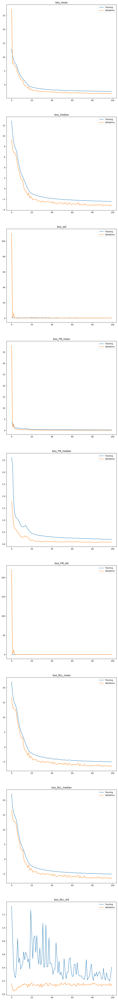

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:38<00:00,  1.98it/s]


{'loss_mean': -3.2930290699005127,
 'loss_median': -3.2930715084075928,
 'loss_std': 0.0745815709233284,
 'loss_FM_mean': 0.07665583491325378,
 'loss_FM_median': 0.07530106604099274,
 'loss_FM_std': 0.007576681207865477,
 'loss_NLL_mean': -6.662714958190918,
 'loss_NLL_median': -6.662740230560303,
 'loss_NLL_std': 0.14553984999656677}

In [ ]:
model.eval()
trainer.load_best_model()
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:38<00:00,  1.99it/s]


{'loss_mean': -3.282011032104492,
 'loss_median': -3.2844016551971436,
 'loss_std': 0.07681835442781448,
 'loss_FM_mean': 0.07798362523317337,
 'loss_FM_median': 0.07824137061834335,
 'loss_FM_std': 0.008382375352084637,
 'loss_NLL_mean': -6.642005920410156,
 'loss_NLL_median': -6.643849849700928,
 'loss_NLL_std': 0.149778813123703}

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model",
    target_device = torch.device("cpu")
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM",
    target_device = torch.device("cpu")
)

benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig_weird1(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)


params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                torch.sin(2*torch.pi*beta) + 1

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
      

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=1_000)

vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=1_000,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [full_model_no_FM, hmc_sampler, vi],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path /content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/PFN_Experiments_CFM_InverseGamma_coupling_LearnedBaseDist_weird1_v1 does not exist, creating it


In [42]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]
0it [00:00, ?it/s]
Sampling posterior:   1%|          | 1/100 [00:14<24:03, 14.58s/it]
0it [00:00, ?it/s]
Sampling posterior:   2%|▏         | 2/100 [00:33<28:01, 17.16s/it]
0it [00:00, ?it/s]
Sampling posterior:   3%|▎         | 3/100 [00:47<25:18, 15.65s/it]
0it [00:00, ?it/s]
Sampling posterior:   4%|▍         | 4/100 [01:04<26:02, 16.27s/it]
0it [00:00, ?it/s]
Sampling posterior:   5%|▌         | 5/100 [01:22<26:53, 16.98s/it]
0it [00:00, ?it/s]
Sampling posterior:   6%|▌         | 6/100 [01:42<27:48, 17.75s/it]
0it [00:00, ?it/s]
Sampling posterior:   7%|▋         | 7/100 [02:00<27:56, 18.03s/it]
0it [00:00, ?it/s]
Sampling posterior:   8%|▊         | 8/100 [02:16<26:35, 17.34s/it]
0it [00:00, ?it/s]
Sampling posterior:   9%|▉         | 9/100 [02:33<26:05, 17.20s/it]
0it [00:00, ?it/s]
Sampling posterior:  10%|█         | 10/100 [02:51<26:07, 17.42s/it]
0it [00:00, ?it/s]
Sampling posterior:  11%|█         | 11/100 [03:09

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:30, 10.61s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:39, 10.81s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:32<17:19, 10.72s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:42<17:06, 10.69s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:53<16:50, 10.64s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:04<16:47, 10.72s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:14<16:35, 10.70s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:25<16:21, 10.67s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:36<16:08, 10.64s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:47<16:05, 10.73s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:57<15:52, 10.70s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:08<15:38, 10.67s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:18<15:27, 10.66s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:29<15:23, 10.74s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:40<15:08, 10.68s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:51<14:57, 10.68s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:01<14:43, 10.64s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:12<14:37, 10.70s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:22<14:20, 10.63s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:33<14:10, 10.63s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:44<14:05, 10.71s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:55<13:54, 10.70s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:05<13:42, 10.68s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:16<13:30, 10.67s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:27<13:24, 10.73s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:37<13:11, 10.69s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:48<12:57, 10.65s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:59<12:47, 10.66s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:09<12:41, 10.72s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:20<12:26, 10.66s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:31<12:13, 10.63s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:41<12:01, 10.61s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:52<11:57, 10.70s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:03<11:43, 10.65s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:13<11:33, 10.66s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:24<11:28, 10.76s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:35<11:14, 10.71s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:45<11:02, 10.68s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:56<10:49, 10.65s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:07<10:42, 10.71s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:17<10:30, 10.69s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:28<10:21, 10.71s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:39<10:08, 10.68s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:50<10:02, 10.76s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:00<09:49, 10.73s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:11<09:37, 10.69s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:22<09:30, 10.77s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:33<09:17, 10.72s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:43<09:06, 10.71s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:54<08:54, 10.69s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:05<08:47, 10.77s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:16<08:35, 10.74s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:26<08:22, 10.69s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:37<08:10, 10.65s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:48<08:03, 10.73s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:58<07:51, 10.72s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:09<07:40, 10.70s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:20<07:28, 10.67s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:30<07:20, 10.73s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:41<07:06, 10.67s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:52<06:55, 10.66s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:02<06:46, 10.70s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:13<06:38, 10.78s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:24<06:26, 10.73s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:35<06:14, 10.70s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:46<06:06, 10.78s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:56<05:53, 10.71s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:07<05:41, 10.68s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:17<05:31, 10.69s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:28<05:22, 10.75s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:39<05:10, 10.71s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:50<04:59, 10.69s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:00<04:49, 10.72s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:11<04:40, 10.78s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:22<04:27, 10.72s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:32<04:16, 10.68s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:43<04:05, 10.69s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [13:54<03:56, 10.77s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:05<03:45, 10.75s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:15<03:34, 10.72s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:26<03:24, 10.78s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:37<03:13, 10.74s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:48<03:02, 10.73s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:58<02:51, 10.71s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:09<02:41, 10.76s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:20<02:30, 10.75s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:31<02:20, 10.77s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:41<02:08, 10.73s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [15:52<01:58, 10.77s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:03<01:47, 10.73s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:14<01:36, 10.72s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:25<01:26, 10.78s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:35<01:15, 10.74s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:46<01:04, 10.70s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [16:56<00:53, 10.65s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:07<00:43, 10.77s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:18<00:32, 10.73s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:29<00:21, 10.70s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:39<00:10, 10.69s/it]

....................


100%|██████████| 100/100 [05:30<00:00,  3.31s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_CST_accuracy,Mean_joint_CST_roc_auc_score,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_CST_accuracy,Std_joint_CST_roc_auc_score,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,20.852286,0.052851,0.50300,0.50300,5.741471,0.128462,0.122861,0.001960,0.000030,0.032380,0.032380,4.073001,0.060987,0.055679
1,full_model_no_FM,gt,20.852071,0.052855,0.50365,0.50365,5.785749,0.128902,0.122111,0.002189,0.000032,0.035942,0.035942,3.788737,0.057979,0.055394
2,Hamiltonian Monte Carlo,gt,20.859517,0.052815,0.50960,0.50960,4.971938,0.140995,0.134473,0.002637,0.000027,0.031660,0.031660,4.495692,0.066782,0.066124
3,Variational Inference with guide: AutoDiagonal...,gt,20.853902,0.052814,0.50590,0.50590,-10.712719,0.136399,0.134736,0.001218,0.000016,0.034041,0.034041,16.578280,0.063136,0.062165


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_CST_accuracy_p-value,joint_CST_roc_auc_score_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,6.351511e-01,5.314573e-01,0.825948,0.770697,4.895006e-01,0.692542,0.478762
1,full_model,Hamiltonian Monte Carlo,4.961042e-18,1.650623e-11,0.127024,0.128853,2.310069e-04,0.000169,0.000141
2,full_model,Variational Inference with guide: AutoDiagonal...,9.167952e-09,1.367400e-13,0.309619,0.331883,3.097733e-16,0.038788,0.000137
3,full_model_no_FM,Hamiltonian Monte Carlo,4.016156e-18,5.490683e-14,0.241423,0.232742,6.650451e-05,0.000608,0.000050
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.987622e-09,1.585286e-15,0.547496,0.550075,1.388391e-16,0.036265,0.000024
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,4.016156e-18,7.403963e-01,0.641182,0.585613,1.557920e-16,0.011726,0.815136



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_CST_accuracy,Mean_CST_roc_auc_score,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_CST_accuracy,Std_CST_roc_auc_score
0,full_model,full_model_no_FM,0.299246,0.030541,0.577680,0.577680,0.106958,0.022752,0.041587,0.041587
1,full_model,Hamiltonian Monte Carlo,0.426530,0.400493,0.843300,0.843300,0.178709,0.240891,0.064872,0.064872
2,full_model,Variational Inference with guide: AutoDiagonal...,0.430903,1.069485,0.950495,0.950495,0.156356,0.379118,0.029209,0.029209
3,full_model_no_FM,Hamiltonian Monte Carlo,0.427212,0.388069,0.837860,0.837860,0.179502,0.244008,0.066524,0.066524
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.436346,1.073330,0.951385,0.951385,0.162527,0.383241,0.029801,0.029801
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.352540,0.554403,0.899930,0.899930,0.150258,0.154663,0.015361,0.015361


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,CST_accuracy_p-value,CST_roc_auc_score_p-value
0,full_model,full_model_no_FM,full_model,Hamiltonian Monte Carlo,3.353783e-11,3.257682e-34,2.638501e-34,2.637609e-34
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,6.749568e-14,2.562144e-34,2.559115e-34,2.558394e-34
2,full_model,full_model_no_FM,full_model_no_FM,Hamiltonian Monte Carlo,3.891648e-11,4.018283e-34,2.800899e-34,2.800269e-34
3,full_model,full_model_no_FM,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,4.733116e-14,2.562144e-34,2.558682e-34,2.557817e-34
4,full_model,Hamiltonian Monte Carlo,full_model,Variational Inference with guide: AutoDiagonal...,5.833206e-01,1.078217e-27,3.189904e-25,3.230969e-25
5,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Hamiltonian Monte Carlo,9.405940e-01,6.036072e-01,5.791303e-01,5.757905e-01
6,full_model,Hamiltonian Monte Carlo,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,4.441267e-04,2.362384e-13,2.359239e-13,2.337454e-13
7,full_model,Variational Inference with guide: AutoDiagonal...,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,7.721670e-01,9.367064e-01,7.451968e-01,7.451965e-01
8,full_model,Variational Inference with guide: AutoDiagonal...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,4.712138e-05,1.360020e-30,1.386021e-27,1.261591e-27
9,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.985628e-01,5.351189e-28,2.767969e-26,2.732137e-26


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          20.852286            0.052851   
  1                                          20.852071            0.052855   
  2                                          20.859517            0.052815   
  3                                          20.853902            0.052814   
  
     Mean_joint_CST_accuracy  Mean_joint_CST_roc_auc_score  \
  0                  0.50300                       0.50300   
  1                  0.50365                       0.50365   
  2                  0.50960                       0.50960   
  3 

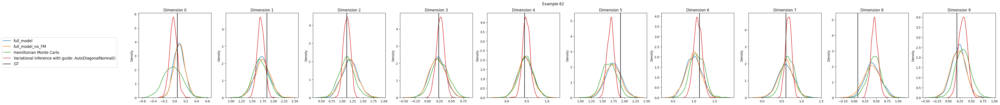

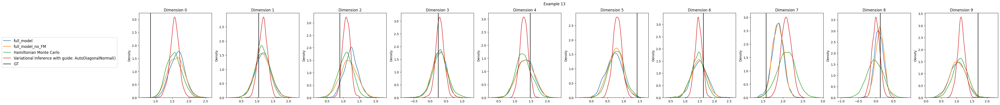

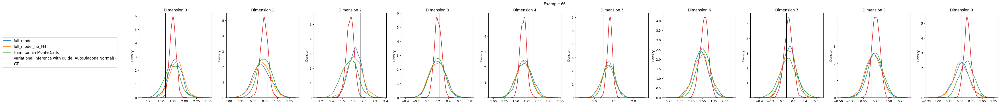

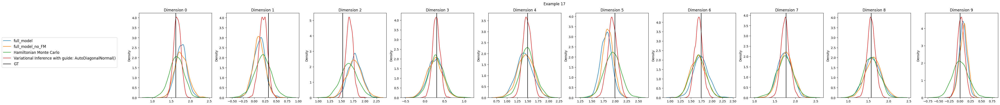

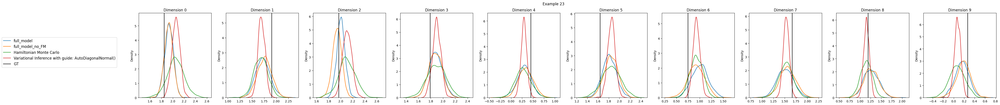

In [43]:
evaluation.plot_results()